Test out gradient descent.

What happens in a mismatch seq2seq?

Q: Translate this sentence to Spanish: Hello world
A: Bonjour le monde

Q: Translate this sentence to French: Hello world
A: Bonjour le monde

Will

In [1]:

from transformers import T5Tokenizer, T5ForConditionalGeneration
import torch
import sentencepiece
import pandas as pd
import matplotlib.pyplot as plt




In [2]:
## Load T5 model and tokenizer

model_prot = T5ForConditionalGeneration.from_pretrained("/scratch/gpfs/cmcwhite/prot_t5_xl_uniref50/")
tokenizer_prot = T5Tokenizer.from_pretrained("/scratch/gpfs/cmcwhite/prot_t5_xl_uniref50/")
model_prot.eval()  # Make sure model is in evaluation mode
cpu_only = False
if cpu_only == True:
    device = "cpu"
elif torch.cuda.is_available():
    device = torch.device("cuda")

#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device", device)
device_ids =list(range(0, torch.cuda.device_count()))
print("device_ids", device_ids)

#model_prot = model_prot.half()
#device = torch.device('cuda:1')
model_prot = model_prot.to(device)


device cuda
device_ids [0, 1, 2, 3]


In [3]:
import sys
print(sys.path)
sys.path.append('/home/cmcwhite/vcmsa/src/vcmsa')
#Load CNN
from SETH_1 import CNN, get_predictions, write_predictions

def load_cnn(cnn_path, device):

    print("Loading SETH_1...")
    predictor = CNN(1, 1024)
    # Load the model directly without checking online

    state = torch.load(cnn_path)
    predictor.load_state_dict(state['state_dict'])

    #if not device.type == 'cpu':
    #    predictor = predictor.half()  # run in half-precision

    predictor = predictor.to(device)
    predictor = predictor.eval()

    return predictor


['/home/cmcwhite', '/home/cmcwhite/ondemand/data/sys/dashboard/batch_connect/sys/jupyter-generic/della-vis/output/a728c0ec-9336-44bd-8b4b-a3532fa1e968', '/home/cmcwhite', '/home/cmcwhite/.conda/envs/vcmsa_env/lib/python39.zip', '/home/cmcwhite/.conda/envs/vcmsa_env/lib/python3.9', '/home/cmcwhite/.conda/envs/vcmsa_env/lib/python3.9/lib-dynload', '', '/home/cmcwhite/.local/lib/python3.9/site-packages', '/home/cmcwhite/vcmsa', '/home/cmcwhite/.conda/envs/vcmsa_env/lib/python3.9/site-packages', '/home/cmcwhite/vcmsa/src']
Using device: cuda:0
IMPORTANT: this will be EXTREMELY slow if not run on GPU. (so the above should say sth like cuda:0).


In [4]:
def print_cuda_memory_usage():
    print("Total memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / 1024**3))
    print("Allocated memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / 1024**3))
    print("Cached memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / 1024**3))
    # Alternatively, for cached memory you can also use (torch.cuda.memory_cached(0) / 1024**3) in versions < 1.4.0

print_cuda_memory_usage()

Total memory: 15.89 GB
Allocated memory: 10.50 GB
Cached memory: 10.50 GB


In [5]:

#Lost this cell in copy and paste w/o save. still on colab version, it was loading a test embedding for sentences

In [6]:
#del CNN
torch.cuda.empty_cache()


In [7]:
%%bash

nvidia-smi


Tue Dec 12 14:38:36 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           On  | 00000000:03:00.0 Off |                    0 |
| N/A   29C    P0              32W / 250W |  15043MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [8]:
def integrated_gradients_embed_old(input_embed, baseline_ids, model, target_ids, steps=10):
    torch.cuda.empty_cache()
    with torch.no_grad():
       baseline = model.get_input_embeddings()(baseline_ids)
    # Calculate the path from baseline to input
    delta = input_embed - baseline
    #print(input_embed.shape, baseline.shape)
    results = []

    for step in range(steps):
        alpha = step / steps
        interpolated_input = baseline + alpha * delta
        #interpolated_input.requires_grad_(True)
        interpolated_input = interpolated_input.clone().detach().requires_grad_(True)
        #print(interpolated_input.shape)
        
        outputs = model(inputs_embeds=interpolated_input, labels=target_ids)
        loss = outputs.loss
        loss.backward()
        torch.cuda.empty_cache()
        results.append(interpolated_input.grad.detach().clone())
        interpolated_input.grad.zero_()

    grads = torch.stack(results).mean(0)
    torch.cuda.empty_cache()
    return grads






In [9]:
model_prot

T5ForConditionalGeneration(
  (shared): Embedding(128, 1024)
  (encoder): T5Stack(
    (embed_tokens): Embedding(128, 1024)
    (block): ModuleList(
      (0): T5Block(
        (layer): ModuleList(
          (0): T5LayerSelfAttention(
            (SelfAttention): T5Attention(
              (q): Linear(in_features=1024, out_features=4096, bias=False)
              (k): Linear(in_features=1024, out_features=4096, bias=False)
              (v): Linear(in_features=1024, out_features=4096, bias=False)
              (o): Linear(in_features=4096, out_features=1024, bias=False)
              (relative_attention_bias): Embedding(32, 32)
            )
            (layer_norm): T5LayerNorm()
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (1): T5LayerFF(
            (DenseReluDense): T5DenseActDense(
              (wi): Linear(in_features=1024, out_features=16384, bias=False)
              (wo): Linear(in_features=16384, out_features=1024, bias=False)
              (dro

In [10]:
def integrated_gradients_embed(input_embed, baseline_ids, model, target_ids, device, steps=10):
    #print_cuda_memory_usage()
    #print("start intgrad")
    input_embed = input_embed.to(device)
    #print(baseline_ids)
    with torch.no_grad():
        baseline = model.get_input_embeddings()(baseline_ids)

    # Calculate the path from baseline to input
    delta = input_embed - baseline
    accum_grads = torch.zeros_like(input_embed).cpu()

    for step in range(steps):
        #print_cuda_memory_usage()
       # print("STEP", step)
        alpha = step / steps
        interpolated_input = baseline + alpha * delta
        interpolated_input = interpolated_input.clone().detach().requires_grad_(True)

        # Reset gradients for the model, if it has trainable parameters
        model.zero_grad()

        
        
        outputs = model(inputs_embeds=interpolated_input, labels=target_ids)
        loss = outputs.loss
        loss.backward()

        # Accumulate gradients in place
        #print(interpolated_input.grad)
        accum_grads += interpolated_input.grad.cpu().detach()

        # This clears the current gradient, ensuring memory isn't consumed by multiple graph
        interpolated_input = None
        torch.cuda.empty_cache()
        gc.collect()
        
    # Compute the average of the accumulated gradients
    grads = accum_grads / steps

    return grads


In [11]:
def pass_embeddings(input_ids, target_ids, model):
    # Convert text to input ids

    # Convert ids to embeddings
  
    with torch.no_grad():
       embeddings = model.get_input_embeddings()(input_ids)

    # Make embeddings require gradients
    #embeddings = embeddings.clone().detach().requires_grad_(True)
    embeddings = embeddings.requires_grad_(True)
    #print(embeddings.dtype)
    #print("before forward pass")
    ##print_cuda_memory_usage()
    # Forward pass with embeddings
    #print("embeds before", embeddings)
    
    outputs = model(inputs_embeds=embeddings, labels=target_ids)
    logits= outputs.logits
    #print(dir(outputs))

    
    loss = outputs.loss
   
    print("loss", loss)
    print(torch.exp(loss))

    # Reshape for cross-entropy calculation: (batch_size * seq_len, vocab_size)
    reshaped_logits = logits.view(-1, logits.size(-1))

    # Flatten target_ids for the same reason: (batch_size * seq_len,)
    reshaped_target_ids = target_ids.view(-1)

    # Calculate cross-entropy loss, without reduction
    loss_fct = torch.nn.CrossEntropyLoss(reduction='none')
    token_loss = loss_fct(reshaped_logits, reshaped_target_ids)

    # Reshape token_loss back to the sequence length for easier interpretation
    token_loss = token_loss.view(target_ids.size())
    print(token_loss.mean())
    print(token_loss.tolist())
    #probabilities = torch.exp(-token_loss)
    #print(probabilities)
    probabilities = token_loss
    
    # Backward pass to get gradients
    loss.backward()
    print("after backward pass")
    
    #print("embeds after", embeddings)
    
    #print(embeddings.shape)
    #print(outputs.encoder_last_hidden_state.shape)
    #embeddings_out = outputs.encoder_last_hidden_state.detach().cpu()
    #print_cuda_memory_usage()
    #print("embeddings.grad", embeddings.grad)
    
    # Clear grads
    model.zero_grad()
    for param in model.parameters():
        param.requires_grad = False
    #print_cuda_memory_usage
     # Delete forward pass  
    outputs = None
    loss = None
    #print("here")
    #print_cuda_memory_usage

    grads = embeddings.grad.detach().cpu()
    embeddings_out =embeddings.detach().cpu()
    embeddings = None
    #print("at end")
    #print_cuda_memory_usage()
    print("what shape", grads.shape)
    return(embeddings_out, grads, probabilities)


#df = get_importance(" ".join(input_seq), " ".join(target_seq), model_prot, tokenizer_prot, device, input_seq_baseline)

In [25]:
import gc
print_cuda_memory_usage()
model_prot = model_prot.to('cpu')
print_cuda_memory_usage()

   # Clear PyTorch cache
torch.cuda.empty_cache() 
print_cuda_memory_usage()
    # Collect garbage
gc.collect()
print_cuda_memory_usage()
model_prot = model_prot.half()
model_prot = model_prot.to(device)
print_cuda_memory_usage()

Total memory: 15.89 GB
Allocated memory: 10.40 GB
Cached memory: 11.45 GB
Total memory: 15.89 GB
Allocated memory: 1.32 GB
Cached memory: 11.45 GB
Total memory: 15.89 GB
Allocated memory: 1.32 GB
Cached memory: 1.96 GB
Total memory: 15.89 GB
Allocated memory: 0.00 GB
Cached memory: 1.96 GB
Total memory: 15.89 GB
Allocated memory: 10.13 GB
Cached memory: 11.45 GB


In [13]:


import gc 
def pass_embeddings_old(input_ids, target_ids, model):
    # Convert text to input ids
    print_cuda_memory_usage()
    # Convert ids to embeddings
    print("do embedding")
    with torch.no_grad():
       embeddings = model.get_input_embeddings()(input_ids)

    print("embedded")
    print_cuda_memory_usage()
    # Make embeddings require gradients
    embeddings = embeddings.clone().detach().requires_grad_(True)
    print(embeddings.dtype)
    print("cloned")
    print_cuda_memory_usage()
    # Forward pass with embeddings
    #with torch.autograd.profiler.profile(use_cuda=True) as prof:
    #torch.set_grad_enabled(False)
    outputs = model(inputs_embeds=embeddings, labels=target_ids)
    print("passed forward")
    print_cuda_memory_usage()
    loss = outputs.loss

    #torch.set_grad_enabled(True)
    # Backward pass to get gradients
    loss.backward()

    grads = embeddings.grad #.cpu().detach()
    out_embeddings = embeddings.cpu().detach()

    
    embeddings = None
    outputs = None
    loss = None

    model.zero_grad()
    del outputs
    del embeddings
    del loss
    gc.collect()
    torch.cuda.empty_cache()
    print("After backward")
    print_cuda_memory_usage()

    # Return both embeddings and gradients
    # Note: embeddings are detached as they are no longer needed for further computation
    return out_embeddings, grads


def get_importance_grad_x_input(input_ids, target_ids, model, tokenizer):
    embeddings = pass_embeddings(input_ids, target_ids, model)
    # Gradients for embeddings
    embedding_gradients = embeddings.grad

    # f. Gradient x Input
    #embeddings = model.get_input_embeddings()(input_ids)
    importance_grad_input = (embedding_gradients * embeddings).sum(dim=-1).squeeze()
    #sorted_pairs = sorted(zip(tokenizer.decode(x) for x in input_ids[0]], importance_grad_input), key=lambda x: x[1])
    pairs = list(zip([tokenizer.decode(x) for x in input_ids[0]], importance_grad_input))
    return(pairs)


# Assuming model, tokenizer, input_text, and target_text are defined

def calculate_t5_perplexity(model, tokenizer, input_ids, target_ids):


    with torch.no_grad():
        decoder_input_ids = target_ids[:, :-1]
        labels = target_ids[:, 1:]
        outputs = model(input_ids=input_ids, decoder_input_ids=decoder_input_ids, labels=labels)
        logits = outputs.logits

    # Calculate log probabilities for each token in the target sequence
    log_probs = -torch.nn.functional.cross_entropy(logits.view(-1, logits.size(-1)), labels.view(-1), reduction='none')
    log_probs = log_probs.view(labels.size())

    print("log_probs", log_probs)
    # Average log likelihood
    avg_log_likelihood = log_probs.sum() / labels.numel()

    #perplexity = torch.exp(-avg_log_likelihood)
    #perplexity.item()
    return log_probs






def get_importance(input_text, target_text, model, tokenizer, device, input_ids_baseline):
    input_ids = tokenizer(input_text, return_tensors="pt").input_ids.to(device)
    target_ids = tokenizer(target_text, return_tensors="pt").input_ids.to(device)
    
    #print("input_ids", input_ids)
    #print("target_ids", target_ids)
    #print(f"{input_text} : {target_text}")
    
    #perplexity = calculate_t5_perplexity(model, tokenizer, input_ids, target_ids)
    #print("Perplexity:", perplexity)
    
    
    
    embeddings, embedding_gradients, probability = pass_embeddings(input_ids, target_ids, model)
    perplexity = probability
    # Gradients for embeddings
    #embedding_gradients = embeddings.grad

    
    torch.cuda.empty_cache()
    
    # f. Gradient x Input
    #embeddings = model.get_input_embeddings()(input_ids)
    importance_grad_input = (embedding_gradients * embeddings).sum(dim=-1).squeeze()
    #print("embedding_gradients", embedding_gradients, embedding_gradients.shape)
    #print("embeddings", embeddings, embeddings.shape)
    #print((embedding_gradients * embeddings).shape)
    #print("eg", embedding_gradients.sum(dim=-1))
    #print("e", embeddings.sum(dim=-1))


    # Norm/vector length
    importance_norm = embedding_gradients.norm(dim=-1).squeeze()
    # a. Sum of Absolute Values
    importance_abs_sum = embedding_gradients.abs().sum(dim=-1).squeeze()

    # b. Maximum Absolute Gradient
    importance_max_abs = embedding_gradients.abs().max(dim=-1)[0].squeeze()

    # c. Variance of Gradients
    importance_variance = embedding_gradients.var(dim=-1).squeeze()

    

    baseline_input_23 = torch.full_like(input_ids, 23)
#    int_grad_23 = integrated_gradients_embed(embeddings, baseline_input_23, model, target_ids, device)
#    importance_intgrad_23 = torch.norm(int_grad_23, dim=-1).squeeze()
    
    print(input_ids.size())
    
    baseline_input_shuffle = input_ids[0, torch.randperm(input_ids.size(0))].unsqueeze(0)
#    int_grad_shuffle = integrated_gradients_embed(embeddings, baseline_input_shuffle, model, target_ids, device)
#    importance_intgrad_shuffle = torch.norm(int_grad_shuffle, dim=-1).squeeze()
    
    baseline_input_2 = torch.full_like(input_ids, 2)
#    int_grad_2 = integrated_gradients_embed(embeddings, baseline_input_2, model, target_ids, device)
#    importance_intgrad_2 = torch.norm(int_grad_2, dim=-1).squeeze()
    
    baseline_input_28 = torch.full_like(input_ids, 28)
#    int_grad_28 = integrated_gradients_embed(embeddings, baseline_input_28, model, target_ids, device)
#    importance_intgrad_28 = torch.norm(int_grad_28, dim=-1).squeeze()
 
    input_ids_baseline_tensor = torch.tensor(input_ids_baseline, device = device, dtype = torch.long)
       
#    int_grad_inputseqbase = integrated_gradients_embed(embeddings, input_ids_baseline_tensor, model, target_ids, device)
#    importance_intgrad_inputseqbase = torch.norm(int_grad_inputseqbase, dim=-1).squeeze()
    
    
    baseline_input = torch.zeros_like(input_ids).int()
#    int_grad = integrated_gradients_embed(embeddings, baseline_input, model, target_ids, device)
#    importance_intgrad = torch.norm(int_grad, dim=-1).squeeze()
    #importance_intgrad = torch.zeros_like(importance_variance)

    # e. SmoothGrad (requires more detailed setup with noise, skipping here)



    # f. IntGradient x Input
    #embeddings = model.get_input_embeddings()(input_ids)
#    importance_intgrad_input = (int_grad * embeddings).sum(dim=-1).squeeze()
   
    # 4. Visualize or analyze the results.
    tokenized_text = tokenizer.convert_ids_to_tokens(input_ids[0])

        ###
    product = embedding_gradients * embeddings
    positive_mask = product > 0

    positive_product = product * positive_mask.float()

    ###
    importance_grad_input_pos = positive_product.sum(dim=-1).squeeze()
    imps_pos = importance_grad_input_pos.detach().tolist()
    
        ###
    # Create a mask where both values are positive
    positive_mask = (embedding_gradients > 0) & (embeddings > 0)
    # Compute the product
    product_bothpos = embedding_gradients * embeddings
    # Use the mask to set non-positive values to zero
    product_bothpos[~positive_mask] = 0
    
    # Compute the sum along the desired dimension
    sum_values_bothpos = product_bothpos.sum(dim=-1).squeeze()
    imps_bothpos = sum_values_bothpos.detach().tolist()

    ###
    # Create a mask where both values are negative
    negative_mask = (embedding_gradients < 0) & (embeddings < 0)
    # Compute the product
    product_bothneg = embedding_gradients * embeddings
    # Use the mask to set non-positive values to zero
    product_bothneg[~negative_mask] = 0

    # Compute the sum along the desired dimension
    sum_values_bothneg = product_bothneg.sum(dim=-1).squeeze()
    imps_bothneg = sum_values_bothneg.detach().tolist()


    # Create a mask where both values are positive
    negpos_mask = (embedding_gradients < 0) & (embeddings > 0)
    # Compute the product
    product = embedding_gradients * embeddings
    # Use the mask to set non-positive values to zero
    product[~negpos_mask] = 0

    # Compute the sum along the desired dimension
    sum_values = product.sum(dim=-1).squeeze()
    imps_negpos = sum_values.detach().tolist()
    
    
    # Create a mask where both values are positive
    posneg_mask = (embedding_gradients > 0) & (embeddings < 0)
    # Compute the product
    product = embedding_gradients * embeddings
    # Use the mask to set non-positive values to zero
    product[~posneg_mask] = 0

    # Compute the sum along the desired dimension
    sum_values = product.sum(dim=-1).squeeze()
    imps_posneg = sum_values.detach().tolist()

  
    
    
    
    pos = list(range(len(importance_norm)))
    pairs = []
    # For simplicity, let's just print out the scores.
#    print("Token-wise importance using different methods:")
#    for p, token, imp0, intgrad, imp1, imp2, imp4, imp5 in zip(pos, tokenized_text, importance_norm, importance_intgrad, importance_abs_sum, importance_max_abs, importance_grad_input, importance_intgrad_input):
        #formatted_str = f"""<div style="font-family: 'Courier New', monospace; white-space: pre;"">Pos: {pos}, Token: {token:18}, Norm: {colored_num(imp0)}, Intgrad: {intgrad:.4f}, Absolute Sum: {imp1:.4f}, Max Absolute: {imp2:.4f}, Grad x Input: {colored_num(imp4)}, Intgrad x Input: {imp5:.4f}</div>"""
        #display(HTML(formatted_str))
#        formatted_str = f"Pos: {p}, Token: {token:18}, Norm: {imp0}, Intgrad: {intgrad:.4f}, Absolute Sum: {imp1:.4f}, Max Absolute: {imp2:.4f}, Grad x Input: {imp4}, Intgrad x Input: {imp5:.4f}"
       # print(formatted_str)
        #Pos: {pos}, Token: {token:18}, Norm: {colored_num(imp0)}, Intgrad: {intgrad:.4f}, Absolute Sum: {imp1:.4f}, Max Absolute: {imp2:.4f}, Grad x Input: {colored_num(imp4)}, Intgrad x Input: {imp5:.4f}</div>"""
        #display(HTML(formatted_str))
        #pos, tokenized_text, importance_norm, importance_intgrad, importance_abs_sum, importance_max_abs, importance_grad_input, importance_intgrad_input):
    #df = pd.DataFrame({'col1': list1, 'col2': list2, 'col3': list3})

    #print(perplexity.squeeze())
    #print(perplexity.squeeze().shape)
    #print(perplexity.cpu().detach())
    
    #print(importance_norm.cpu().detach().numpy())
    #print(importance_norm.cpu().detach().numpy())
    #print(perplexity.squeeze().cpu().detach().shape)
    #print(perplexity.squeeze().cpu().detach().numpy().shape)
    #print(perplexity.cpu().tolist())
    print(len(pos))
    perplexity_list = perplexity.squeeze().cpu().detach().tolist()
    print(len(perplexity_list))
    if len(pos) > len(perplexity_list):
        length_diff = len(pos) - len(perplexity_list)
        perplexity_list = perplexity_list + [0]*length_diff
    else:
        perplexity_list = perplexity_list[0: len(pos)]
    print(len(perplexity_list))
        
    df = pd.DataFrame({
    'pos': pos,
    'tokenized_text': tokenized_text,
    'importance_norm': importance_norm.cpu().detach().numpy(),
    'perplexity': perplexity_list,
    #'importance_intgrad': importance_intgrad.cpu().detach().numpy(),
    #'importance_intgrad_23': importance_intgrad_23.cpu().detach().numpy(),
    #'importance_intgrad_2': importance_intgrad_2.cpu().detach().numpy(),
    #'importance_intgrad_28': importance_intgrad_28.cpu().detach().numpy(),
    #'importance_intgrad_shuffle': importance_intgrad_shuffle.cpu().detach().numpy(),
    #'importance_intgrad_inputseqbase': importance_intgrad_inputseqbase.cpu().detach().numpy(),

    'importance_abs_sum': importance_abs_sum.cpu().detach().numpy(),
    'importance_max_abs': importance_max_abs.cpu().detach().numpy(),
    'importance_grad_input': importance_grad_input.cpu().detach().numpy(),
    
    #'importance_intgrad_input': importance_intgrad_input.cpu().detach().numpy(),
    'imps_pos': imps_pos,#.cpu().detach().numpy(),
    'imps_bothpos': imps_bothpos,#.cpu().detach().numpy(),
    'imps_bothneg': imps_bothneg,#.cpu().detach().numpy(),
    'imps_posneg': imps_posneg,#.cpu().detach().numpy(),
    'imps_negpos': imps_negpos,#.cpu().detach().numpy(),
    'importance_variance' : importance_variance.cpu().detach().numpy()
        
        
    })
    return(df)


def get_diso(seq_dict, model, tokenizer, CNN, form = "Cs"):
    #cnn_pat
    #izer = get_prott5(root_dir)

    #CNN = load_CNN_ckeckpoint(root_dir)

    predictions = get_predictions(seq_dict, model, tokenizer, CNN, form)
    #/print(predictions)
    #write_predictions(out_path, predictions, form)
    return(predictions)

    # Rank embeddings (tokens) based on gradient magnitudes

    #print(embedding_gradients.shape)
    #print(embedding_gradients)
    #print(embedding_gradients.norm(dim = -1))

    #print(token_importance)
    #print(token_importance.argmax())
     #  Get most influential token index
    #influential_token_index = token_importance.argmax().item()

    # Decode and print the influential token
    #print(tokenizer.decode(input_ids[0][influential_token_index]))
    #for x in list(zip([tokenizer.decode(x) for x in input_ids[0]], token_importance.float())):
    #    print(x)

In [14]:
from IPython.core.display import display, HTML

def colored_num(n):
    if n < 0:
        color = 'red'
    elif n > 0:
        color = 'green'
    else:
        color = 'black'
    return f'<span style="color: {color}">{n:7.3f}</span>'

#def display_colored_numbers(numbers):
#    colored_nums = [colored_num(n) for n in numbers]
#    display(HTML(' '.join(colored_nums)))

/tmp/ipykernel_629227/3117703793.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [15]:


if next(model_prot.parameters()).is_cuda:
    print("Model 1 is on GPU")
CNN_diso = load_cnn("/scratch/gpfs/cmcwhite/SETH_CNN.pt", device)
CNN_diso = CNN_diso.half()
if next(CNN_diso.parameters()).is_cuda:
    print("Model 2 is on GPU")
    
    
if next(model_prot.encoder.parameters()).is_cuda:
    print("Model 3 is on GPU")


Model 1 is on GPU
Loading SETH_1...
Model 2 is on GPU
Model 3 is on GPU


In [16]:
import random
def scramble_string(s):
    # Convert the string to a list of characters
    char_list = list(s)
    
    # Shuffle the list of characters
    random.shuffle(char_list)
    
    # Convert the list of characters back to a string
    scrambled = ''.join(char_list)
    
    return scrambled

In [17]:


##>sp|P03643|G_BPPHS Major spike protein G OS=Enterobacteria phage phiX174 OX=1217068 GN=G PE=1 SV=1
phix="MFQTFISRHNSNFFSDKLVLTSVTPASSAPVLQTPKATSSTLYFDSLTVNAGNGGFLHCIQMDTSVNAANQVVSVGADIAFDADPKFFACLVRFESSSVPTTLPTAYDVYPLNGRHDGGYYTVKDCVTIDVLPRTPGNNVYVGFMVWSNFTATKCRGLVSLNQVIKEIICLQPLK"
##>sp|P03644|G_BPG4 Major spike protein G OS=Escherichia phage G4 OX=10843 GN=G PE=1 SV=1
g4="MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILINATTTAVTTHSGLCHVVRIDETNPTNHHALSIAGSLSNVPADMIAFAIRFEVADGVVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTVGNDVYAGIMLWSNAWTASTISGVLSVNQVNREATVLQPLK"

ldha_pig = "MATLKDQLIHNLLKEEHVPHNKITVVGVGAVGMACAISILMKELADEIALVDVMEDKLKGEMMDLQHGSLFLRTPKIVSGKDYNVTANSRLVVITAGARQQEGESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGSGCNLDSARFRYLMGERLGVHPLSCHGWILGEHGDSSVPVWSGVNVAGVSLKNLHPELGTDADKEHWKAVHKQVVDSAYEVIKLKGYTSWAIGLSVADLAESIMKNLRRVHPISTMIKGLYGIKEDVFLSVPCILGQNGISDVVKVTLTPEEEAHLKKSADTLWGIQKELQF"

mdhm_pig = "MLSALARPAGAALRRSFSTSXQNNAKVAVLGASGGIGQPLSLLLKNSPLVSRLTLYDIAHTPGVAADLSHIETRATVKGYLGPEQLPDCLKGCDVVVIPAGVPRKPGMTRDDLFNTNATIVATLTAACAQHCPDAMICIISNPVNSTIPITAEVFKKHGVYNPNKIFGVTTLDIVRANAFVAELKGLDPARVSVPVIGGHAGKTIIPLISQCTPKVDFPQDQLSTLTGRIQEAGTEVVKAKAGAGSATLSMAYAGARFVFSLVDAMNGKEGVVECSFVKSQETDCPYFSTPLLLGKKGIEKNLGIGKISPFEEKMIAEAIPELKASIKKGEEFVKNMK"


zeb="QGLRCLFCPVTSLNSSCAPVVTECPVQELCYTADGRFGRSSVLFRKGCMLRADCSRSRHQMIRGNNISFSFSCCGGHYCNSQPRAEPGGRLLLLLLPAAALTAAGAL"
med="ENLHCYYSPVLEKEITFELVVTECPPNEMCFKGLGRYGNYTALSARGCMLEKDCSQVHSLRLLGTVYTMSYSCCDWPYCNRAVALEPFTAMLVAAAVVACSFCLT"

zeb_mask="QGLRCLFCPVTSLNSSCAPVVTECPVQELCYTADGRFGRSSVLFRKGCMLRADCSRSRHQMIRGNNISFSFSCCGGHYCNSQPRAEPGGRLLLLLLXXXALTAAGAL"
med_mask="ENLHCYYSPVLEKEITFELVVTECPPNEMCFKGLGRYGNYTALSARGCMLEKDCSQVHSLRLLGTVYTMSYSCCDWPYCNRAVALEPFTAMLVAAAVVACSFCLX"

# I think masking gaps and disorder are important

# WITH GAPS MASKED, prioritizes start + divergence region
ldha_mask="MATLKDQLIHNLLKEEHVPHNKITVVGVGAVGMACAISILMKELADEIALVDVMEDXXKGEMMDLQHXXXXLRTPKIVSGKDYNVTANSRLVVITAGARQQEGESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGSXCNLDSARFRYLMGERLGVHPLSCHGWILGEHGDSSVPVWSGVNVAXXXXXXXXXXXXTDADKEHWKAVHKQVVDSAYEVIKLKGYTSWAIGLSVAXXXXXXXXNLRRVHPISTMIKGLYGIKEDVFLSVPCILGQNGISDVVKVTLTPEEEAHLKKSADTLWGIQKELQF"
mdhm_mask = "MXXXXARPAGAALRRSFSTSXQNNAKVAVLGASGGIGQPLSLLLKNSPLVSRLTLYDIAHTPGVAADLSHIETRATVKGXXXXXQLPDCLKGCDVVVIPAGVPRKPGMTRDDLFNTNATIVATLTAACAQHCPDAMICIISNPVNXXXXITAEVFKKHGVYNPNKIFGVTTLDIVRANAFVAELKGLDPARVSVPVIGGHXGKTIIPLISQCTPKVDFPQDQLSTLTGRIQEAGTEVVKAKXGAGSATLSMAYAGARFVFSLVDAMNGKEGVVECSFVXXXXXXXXXXSTPLLLGKKGIEKNLGIXKISPFEEKMIAEAIPELKAXIKKGEEFXXXXX"
ldha_mod_mask="MATLKDQLIHNLLKEEHVPHNKITVVGVGAVGMACAISILMKELADEIALVDVMEDXXKGEMMDLQHXXXXLRTPKIVSGKDYNVTANSRLVVITAGARRQEGESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGSXCNLDSARFRYLMGERLGVHPLSCHGWILGEHGDSSVPVWSGVNVAXXXXXXXXXXXXTDADKEHWKAVHKQVVDSAYEVIKLKGYTSWAIGLSVAXXXXXXXXNLRRVHPISTMIKGLYGIKEDVFLSVPCILGQNGISDVVKVTLTPEEEAHLKKSADTLWGIQKELQF"
ldha_mask_script ="XXXXXXXXXXXXXXXXXXXHNKITVVGVGAXGMACAISILMKELADEIALVDVMEDXXKGEMMDLQHGSLFLRTPKIVSGKDYNVTANSRLVVITAGARQQEXESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGXGCNLDSARFRYLMGERLGVHPLSCHGWILGEHGDSSVPVWSGVNVXXXXXXXXXXEXXTDADKEHWKAVHKQVVDXXXEVIKLKGYTSWAIGLSVXXXXXXXXKNLRRVHPISTMIKGLYGIKEDVFLSVPCILGQNGISDVVKVTLTPEEEAHLKKSADTLWGIQKELQX"
ldha_mod2_mask="MATLKDQLIHNLLKEEHVPHNKITVVGVGAVGMACAISILMKELADEIALVDVMEDXXKGEMMDLQHXXXXLRTPKIVSGKDYNVTANSRLVVITAGARQQEGESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGSXCNLDSARFRYLMGERLGVHPLSCHGWILGEHGDSSVPVWSGVNVAXXXXXXXXXXXXTDADKEHWKAVHKQVVDSAYEVLKLKGYTSWAIGLSVAXXXXXXXXNLRRVHPISTMIKGLYGIKEDVFLSVPCILGQNGISDVVKVTLTPEEEAHLKKSADTLWGIQKELQF"

mdhm_mask_script ="XXXXXXXXXXXXXXXXXXXXXXXNAKVAVLGASGGIGQPLSLLLKNXXLVSRLTLYDIAHTPGVAADLSHIETRATVKGYLXPEQLPDCLKGCDVVVIPAGVPRKPXMTRDDLFNTNATIVATLTAACAQHCPDAMICIISNPVNSTIPIXXXVFKKHGXYNPNKIFGVTTLDIVRANAFVAELKGLDPARVSVPVIGGHXGKTIIPLISQCTPKVDFPQDQLSTLTGRIQEXXXEVVKAKAGXGSATLSMAYAGARFVFSLVDAMNGKEGVVXXXXXXXXXXDCPYFSTPLLLGKKGIEKNLGIGKXSPFEEKMIAEAIPEXKASIKKGEEXXXXXX"

phix_mask =           "MFQTFISRHNSNFFSDKLVLTSXTPASSAPVLQTPKATSSTLYFDSLTVNAGNGGFLHCIQMDTSVNAANQVVSVGADIAXDADPKFFACLVRFESSSVPTTLPTAYDVYPLNGRHDGGYYTVKDCVTIDVLPRTPGNNVYVGFMVWSNFTATKCRGLVSLNQVIKEIICLQPLK"
g4_mask  =            "MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILINATTTAXTTHSGLCHVVRIDETNPTNHHALSIAGSLSNVPADMIAFAIRFEVADXXVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTVGNDVYAGIMLWSNXWTASTISGVLSVNQVNREATVLQPLK"
g4_mod_mask_6mut =    "MFQKFISKHNAPINSTQLAATVTPAVAAPVLSVPNLSRSTILINALTTAXTTHSGFLHCVQIDETNNTNHHALSIAGSLSNFPADMKAFAIRFEVEDXXVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTPGNDVYAGFMLWSNAWTASTISGVLSVNQVNREATVLQPLK"
g4_mod_mask_1mut =    "MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILINATTTAXTTHSGLCHVVQIDETNPTNHHALSIAGSLSNVPADMIAFAIRFEVADXXVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTVGNDVYAGIMLWSNAWTASTISGVLSVNQVNREATVLQPLK"
g4_mod_mask_1randmut= "MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILINATTTAXTTHSGLCHVVQIDETNPTNHHALSIAGSLSNVDADMIAFAIRFEVADXXVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTVGNDVYAGIMLWSNXWTASTISGVLSVNQVIREATVLQPLK"
#g4_mod_mask_1randmut2="MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILINATTTAXTTHSGLLHVVRIDETNPTNHHALSIAGSLSNVPADMIAFAIRFEVADXXVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTVGNDVYAGIMLWSNXWTASTISGVLSVNQVNREATVLQPLK"
g4_mod_mask_1randmut2 = 'MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTLLIDSTTTAXTTHSGLCHVVRMDETNNTANHVLSIAGDLSNVDADPIAFAIRFRFEDXXVPTTVPALYDVYPINGFNNGKAYSFKDCVTIDSHPRTVGNDVYAGFMVWSNAWTATKCSGVLSVNQVIKEITVLQPLK'
g4_mod_mask_1randmut3 = 'MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILFNATTTAXTTHSGLLHCVQIDESNPANNHALSVGGDLSNFPADMIAFAILFRFADXXVPTTVPALYDVYPINTFNNGKYYSFKDCVTIDSHPRTVGNDVYAGFMVWSNAFTATKCSGVLSLNQVIKEITVLQPLK'


#device = "cpu"
#model_prot = model_prot.to(device)
#input_seq = g4_mask
#target_seq = phix_mask
#extra_seq = g4_mod_mask_1mut
extra_seq = ldha_mod_mask
extra_seq2 = ldha_mod2_mask#g4_mod_mask_6mut
offtarget_seq = g4_mod_mask_1randmut
offtarget_seq2 = g4_mod_mask_1randmut2
#input_seq = ldha_mask
#target_seq = mdhm_mask
input_seq = zeb_mask
target_seq = med_mask
#input_seq = phix_mask
#target_seq = g4_mask
#input_seq = ldha_mask
#target_seq = mdhm_mask
scramble_seq = scramble_string(ldha_mask) #"MTGELVISLIVESTHISISAPROTEINAAA" #scramble_string(ldha_mask)
other_seq=  g4_mod_mask_1randmut3
#extra_seq = phix_mask

seq_dict = {"target_seq":target_seq, "input_seq":input_seq, "extra_seq" :extra_seq, "offtarget_seq": offtarget_seq, "extra_seq2" :extra_seq2, "offtarget_seq2": offtarget_seq2, "other_seq" : other_seq, "scramble_seq" : scramble_seq}
print(seq_dict)

diso_dict = get_diso(seq_dict, model_prot.encoder, tokenizer_prot, CNN_diso)

#print(diso_dict.keys())
#input_seq= ''.join(['X' if flag else char for char, flag in zip(input_seq, diso_dict['input_seq'][1])])
#target_seq= ''.join(['X' if flag else char for char, flag in zip(target_seq, diso_dict['target_seq'][1])])
#extra_seq =  ''.join(['X' if flag else char for char, flag in zip(extra_seq, diso_dict['extra_seq'][1])])
#extra_seq2 =  ''.join(['X' if flag else char for char, flag in zip(extra_seq2, diso_dict['extra_seq2'][1])])
#offtarget_seq= ''.join(['X' if flag else char for char, flag in zip(offtarget_seq, diso_dict['offtarget_seq'][1])])
#offtarget_seq2= ''.join(['X' if flag else char for char, flag in zip(offtarget_seq2, diso_dict['offtarget_seq2'][1])])
#other_seq =  ''.join(['X' if flag else char for char, flag in zip(other_seq, diso_dict['extra_seq'][1])])
#scramble_seq =  ''.join(['X' if flag else char for char, flag in zip(scramble_seq, diso_dict['extra_seq2'][1])])

#M = 19
#G = 5
#A = 3
#input_seq_baseline = [5 if flag else 3 for char, flag in zip(input_seq, diso_dict['input_seq'][1])]
input_seq_baseline =  [5]* len(input_seq)
input_seq_baseline[0] = 19
input_seq_baseline.append(1)
print(input_seq_baseline)

#input_seq = ldha_mask_script
#target_seq = mdhm_mask_script
#Danio_rerio_XP_005173770.1_(ze      RADCSRSRHQMIRGNNISFSFSCCGGHYCNSQPRAEPGGRLLLLLLPAAA
#Oryzias_latipes_H2LID1.1_(meda      EKDCSQVHSLRLLGTVYTMSYSCCDWPYCNRAVALEPFTAMLVAAA---V
#input_seq =  "XNLHCYYSPVLEKEITFELVVTECPPNEMCFKGLGRYGNYTALSARGCMLEKDCSQVHSLRLLGTVYTMSYSCCGGHYCNSXXXXXXXXXXXXXXXXXXXXXXXX"
#target_seq = "XGLRCLFCPVTSLNSSCAPVVTECPVQELCYTADGRFGRSSVLFRKGCMLRADCSRSRHQMIRGNNISFSFSCCGGHYCNSXXXXXXXXXXXXXXXXXXXXXXXXXX"

print(input_seq)
print(target_seq)


input_ids = tokenizer_prot(" ".join(input_seq), return_tensors="pt").input_ids.to(device)
target_ids = tokenizer_prot(" ".join(target_seq), return_tensors="pt").input_ids.to(device)
extra_ids = tokenizer_prot(" ".join(extra_seq), return_tensors="pt").input_ids.to(device)
extra_ids2 = tokenizer_prot(" ".join(extra_seq2), return_tensors="pt").input_ids.to(device)

offtarget_ids = tokenizer_prot(" ".join(offtarget_seq), return_tensors="pt").input_ids.to(device)
offtarget_ids2 = tokenizer_prot(" ".join(offtarget_seq2), return_tensors="pt").input_ids.to(device)

other_ids = tokenizer_prot(" ".join(other_seq), return_tensors="pt").input_ids.to(device)
scramble_ids = tokenizer_prot(" ".join(scramble_seq), return_tensors="pt").input_ids.to(device)


{'target_seq': 'ENLHCYYSPVLEKEITFELVVTECPPNEMCFKGLGRYGNYTALSARGCMLEKDCSQVHSLRLLGTVYTMSYSCCDWPYCNRAVALEPFTAMLVAAAVVACSFCLX', 'input_seq': 'QGLRCLFCPVTSLNSSCAPVVTECPVQELCYTADGRFGRSSVLFRKGCMLRADCSRSRHQMIRGNNISFSFSCCGGHYCNSQPRAEPGGRLLLLLLXXXALTAAGAL', 'extra_seq': 'MATLKDQLIHNLLKEEHVPHNKITVVGVGAVGMACAISILMKELADEIALVDVMEDXXKGEMMDLQHXXXXLRTPKIVSGKDYNVTANSRLVVITAGARRQEGESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGSXCNLDSARFRYLMGERLGVHPLSCHGWILGEHGDSSVPVWSGVNVAXXXXXXXXXXXXTDADKEHWKAVHKQVVDSAYEVIKLKGYTSWAIGLSVAXXXXXXXXNLRRVHPISTMIKGLYGIKEDVFLSVPCILGQNGISDVVKVTLTPEEEAHLKKSADTLWGIQKELQF', 'offtarget_seq': 'MFQKFISKHNAPINSTQLAATKTPAVAAPVLSVPNLSRSTILINATTTAXTTHSGLCHVVQIDETNPTNHHALSIAGSLSNVDADMIAFAIRFEVADXXVPTAVPALYDVYPIETFNNGKAISFKDAVTIDSHPRTVGNDVYAGIMLWSNXWTASTISGVLSVNQVIREATVLQPLK', 'extra_seq2': 'MATLKDQLIHNLLKEEHVPHNKITVVGVGAVGMACAISILMKELADEIALVDVMEDXXKGEMMDLQHXXXXLRTPKIVSGKDYNVTANSRLVVITAGARQQEGESRLNLVQRNVNIFKFIIPNIVKYSPNCKLLVVSNPVDILTYVAWKISGFPKNRVIGSXCNLDSARFRYLMGERLGVHPLSCHGWIL

In [18]:
#from fairscale.nn.data_parallel import FullyShardedDataParallel as FSDP
#tokenizer_prot.get_vocab()


In [23]:
#import torch.distributed as dist

#dist.init_process_group(backend='nccl')
#model_prot = model_prot.to("cpu")
#model_prot =  FSDP(model_prot)


In [26]:

torch.cuda.empty_cache()

df = get_importance(" ".join(input_seq), " ".join(target_seq), model_prot, tokenizer_prot, device, input_seq_baseline)
window_size = 5  # Adjust this based on your requirements

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df[f'{column}_rolling'] = df[column].rolling(window=window_size).mean()

df['color'] = df['tokenized_text'].str.contains("X")

RuntimeError: CUDA out of memory. Tried to allocate 2.00 MiB (GPU 0; 15.89 GiB total capacity; 10.56 GiB already allocated; 40.69 MiB free; 11.45 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [22]:
df[40:60]

NameError: name 'df' is not defined

In [22]:
df_self = get_importance(" ".join(input_seq), " ".join(input_seq), model_prot, tokenizer_prot, device, input_seq_baseline)
window_size = 5  # Adjust this based on your requirements

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_self.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_self[f'{column}_rolling'] = df_self[column].rolling(window=window_size).mean()

df_self['color'] = df_self['tokenized_text'].str.contains("X")


loss tensor(5.9605e-08, device='cuda:0', dtype=torch.float16,
       grad_fn=<NllLossBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<ExpBackward0>)
tensor(5.9605e-08, device='cuda:0', dtype=torch.float16,
       grad_fn=<MeanBackward0>)
[[1.1920928955078125e-07, -0.0, 1.1920928955078125e-07, -0.0, 2.384185791015625e-07, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, 1.1920928955078125e-07, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, -0.0, -0.0, -0.0, 4.76837158203125e-07, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, -0.0, 1.1920928955078125e-07, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, 1.1920928955078125e-07, -0.0, -0.0, -0.0, -0.0

In [23]:
df_extra = get_importance(" ".join(input_seq), " ".join(extra_seq), model_prot, tokenizer_prot, device, input_seq_baseline)

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_extra.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_extra[f'{column}_rolling'] = df_extra[column].rolling(window=window_size).mean()

df_extra['color'] = df_extra['tokenized_text'].str.contains("X")

df_extra2 = get_importance(" ".join(input_seq), " ".join(extra_seq2), model_prot, tokenizer_prot, device, input_seq_baseline)

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_extra2.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_extra2[f'{column}_rolling'] = df_extra2[column].rolling(window=window_size).mean()

df_extra2['color'] = df_extra2['tokenized_text'].str.contains("X")


loss tensor(13.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<NllLossBackward0>)
tensor(inf, device='cuda:0', dtype=torch.float16, grad_fn=<ExpBackward0>)
tensor(13.5938, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
[[19.84375, 19.9375, 20.328125, 19.9375, 23.078125, 18.203125, 19.953125, 18.1875, 20.25, 24.96875, 22.953125, 20.328125, 19.34375, 21.5, 12.2734375, 5.26953125, 21.1875, 19.234375, 19.203125, 19.953125, 21.875, 22.15625, 11.8984375, 12.1953125, 20.546875, 2.384185791015625e-07, 19.59375, 13.4765625, 5.36328125, 17.671875, 0.036895751953125, 20.515625, 11.9921875, 13.171875, 17.21875, 15.875, 13.734375, 19.21875, 8.1796875, 15.6796875, 5.9375, 10.3671875, 17.09375, 19.265625, 17.03125, 19.15625, 16.03125, 19.703125, 20.75, 8.8828125, 15.0546875, 22.5, 21.78125, 18.859375, 21.140625, 9.2890625, 9.9140625, 0.0011510848999023438, 9.9375, 7.0546875, 16.015625, 10.046875, 13.5859375, 16.59375, 14.140625, 9.4140625, 14.515625, 18.015625, 1.8515625, 

In [24]:
df_target_diff = df[df['tokenized_text'] != "_X"]['importance_norm'][:-1] - df_extra[df_extra['tokenized_text'] != "_X"]['importance_norm'][:-1]
df_orig_diff = df_self[df_self['tokenized_text'] != "_X"]['importance_norm'][:-1] - df_extra[df_extra['tokenized_text'] != "_X"]['importance_norm'][:-1]

    #print(df_target_diff.tolist())
    #print(df_orig_diff.tolist())

target_diff_mean = df_target_diff.mean()
orig_diff_mean = df_orig_diff.mean()

print(target_diff_mean)
print(orig_diff_mean) 

-0.005695
-0.006725


In [25]:
df_other = get_importance(" ".join(input_seq), " ".join(other_seq), model_prot, tokenizer_prot, device, input_seq_baseline)

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_other.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_other[f'{column}_rolling'] = df_other[column].rolling(window=window_size).mean()

df_other['color'] = df_other['tokenized_text'].str.contains("X")

loss tensor(14.9453, device='cuda:0', dtype=torch.float16,
       grad_fn=<NllLossBackward0>)
tensor(inf, device='cuda:0', dtype=torch.float16, grad_fn=<ExpBackward0>)
tensor(14.9453, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
[[19.84375, 22.75, 17.90625, 19.34375, 17.890625, 16.96875, 18.625, 28.109375, 24.078125, 23.0625, 14.3984375, 19.703125, 9.5390625, 0.00020384788513183594, 1.1920928955078125e-07, 16.84375, 28.109375, 19.6875, 20.59375, 18.421875, 18.484375, 19.703125, 21.9375, 14.5390625, 8.0703125, 17.78125, 17.609375, 18.6875, 12.3203125, 11.21875, 13.6796875, 4.30078125, 10.5078125, 16.21875, 22.6875, 21.296875, 14.328125, 0.067626953125, 0.007068634033203125, 18.59375, 18.609375, 0.00012290477752685547, -0.0, 24.03125, 20.421875, 21.90625, 22.125, 20.6875, 19.484375, 22.65625, 18.640625, 19.8125, 17.15625, 0.0004069805145263672, 14.2890625, 17.625, 21.171875, 19.453125, 10.359375, 2.44140625, 13.375, 2.935546875, 14.3671875, 5.33984375, 9.9765625, 11.078

In [26]:
df_scramble = get_importance(" ".join(input_seq), " ".join(scramble_seq), model_prot, tokenizer_prot, device, input_seq_baseline)

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_scramble.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_scramble[f'{column}_rolling'] = df_scramble[column].rolling(window=window_size).mean()

df_scramble['color'] = df_scramble['tokenized_text'].str.contains("X")

loss tensor(13.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<NllLossBackward0>)
tensor(inf, device='cuda:0', dtype=torch.float16, grad_fn=<ExpBackward0>)
tensor(13.6719, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
[[20.34375, 22.375, 21.375, 22.25, 21.578125, 18.515625, 11.90625, 21.046875, 12.296875, 14.15625, 3.0279159545898438e-05, 18.453125, 18.640625, 0.01148223876953125, 22.5, 18.9375, 19.3125, 26.625, 26.265625, 24.546875, 9.484375, 19.8125, 19.15625, 11.34375, 15.375, 18.46875, 25.984375, 4.76837158203125e-07, 20.59375, 17.109375, 20.078125, 15.9375, -0.0, 19.859375, 21.625, 19.8125, 21.546875, 19.8125, 18.5, 18.90625, 0.37548828125, 19.375, 19.09375, 8.4921875, 14.8515625, 21.25, 12.0625, 15.6015625, 14.0390625, 0.0679931640625, 8.953125, 12.9296875, 13.4296875, 16.59375, 13.8203125, 9.2890625, 7.9375, 8.8984375, 14.7109375, 19.15625, 21.640625, 22.265625, 9.1875, 6.1796875, 11.9609375, 21.8125, 7.09375, 7.234375, 7.46875, 5.13671875, 8.953125,

In [27]:
df_offtarget = get_importance(" ".join(input_seq), " ".join(offtarget_seq), model_prot, tokenizer_prot, device, input_seq_baseline)

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_offtarget.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_offtarget[f'{column}_rolling'] = df_offtarget[column].rolling(window=window_size).mean()

df_offtarget['color'] = df_offtarget['tokenized_text'].str.contains("X")


loss tensor(15.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<NllLossBackward0>)
tensor(inf, device='cuda:0', dtype=torch.float16, grad_fn=<ExpBackward0>)
tensor(15.2188, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
[[19.84375, 22.75, 17.90625, 19.34375, 17.890625, 16.96875, 18.625, 28.109375, 24.078125, 23.0625, 14.3984375, 19.703125, 9.5390625, 0.00020384788513183594, 1.1920928955078125e-07, 16.84375, 28.109375, 19.6875, 20.59375, 18.421875, 18.484375, 19.703125, 21.9375, 14.5390625, 8.0703125, 17.78125, 17.609375, 18.6875, 12.3203125, 11.21875, 13.6796875, 4.30078125, 10.5078125, 16.21875, 22.6875, 21.296875, 14.328125, 0.067626953125, 0.007068634033203125, 18.59375, 18.609375, 0.00012290477752685547, 18.921875, 23.453125, 20.609375, 22.078125, 22.03125, 20.640625, 19.4375, 23.5625, 18.671875, 19.546875, 16.859375, 4.76837158203125e-06, 12.359375, 16.65625, 19.0625, 18.71875, 15.109375, 12.1328125, 15.109375, 21.90625, 11.1796875, 14.1171875, 13.90625,

In [28]:

df_offtarget2 = get_importance(" ".join(input_seq), " ".join(offtarget_seq2), model_prot, tokenizer_prot, device, input_seq_baseline)

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
for column in df_offtarget2.columns:
    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
        if column != 'tokenized_text':
            df_offtarget2[f'{column}_rolling'] = df_offtarget2[column].rolling(window=window_size).mean()

df_offtarget2['color'] = df_offtarget['tokenized_text'].str.contains("X")

loss tensor(14.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<NllLossBackward0>)
tensor(inf, device='cuda:0', dtype=torch.float16, grad_fn=<ExpBackward0>)
tensor(14.7500, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
[[19.84375, 22.75, 17.90625, 19.34375, 17.890625, 16.96875, 18.625, 28.109375, 24.078125, 23.0625, 14.3984375, 19.703125, 9.5390625, 0.00020384788513183594, 1.1920928955078125e-07, 16.84375, 28.109375, 19.6875, 20.59375, 18.421875, 18.484375, 19.703125, 21.9375, 14.5390625, 8.0703125, 17.78125, 17.609375, 18.6875, 12.3203125, 11.21875, 13.6796875, 4.30078125, 10.5078125, 16.21875, 22.6875, 21.296875, 14.328125, 0.067626953125, 0.007068634033203125, 18.59375, 11.0625, 0.0015630722045898438, 18.765625, 23.578125, 20.96875, 22.5, 21.984375, 20.921875, 19.546875, 23.4375, 18.484375, 19.40625, 16.4375, 7.033348083496094e-06, 15.7109375, 14.3828125, 13.1015625, 12.5703125, 5.2734375, 6.921875, 1.049041748046875e-05, 18.265625, 12.5, 11.5234375, 7.17

In [29]:
df[45:70]

,pos,tokenized_text,importance_norm,perplexity,importance_abs_sum,importance_max_abs,importance_grad_input,imps_pos,imps_bothpos,imps_bothneg,...,importance_abs_sum_rolling,importance_max_abs_rolling,importance_grad_input_rolling,imps_pos_rolling,imps_bothpos_rolling,imps_bothneg_rolling,imps_posneg_rolling,imps_negpos_rolling,importance_variance_rolling,color
45,45,▁K,0.000000,2.037500e+01,0.024857,0.000104,-0.003119,0.008975,0.004139,0.004837,...,0.029330,0.000131,-0.000364,0.010910,0.005803,0.005107,-0.005609,-0.005665,0.0,False
46,46,▁G,0.000000,-0.000000e+00,0.024017,0.000105,-0.000411,0.008972,0.004623,0.004349,...,0.028659,0.000125,-0.000450,0.010934,0.005685,0.005249,-0.005772,-0.005611,0.0,False
47,47,▁C,0.001424,-0.000000e+00,0.063782,0.000320,-0.004128,0.025371,0.013115,0.012253,...,0.034140,0.000162,-0.000848,0.013601,0.007040,0.006561,-0.007460,-0.006989,0.0,False
48,48,▁M,0.000000,-0.000000e+00,0.030991,0.000147,0.002190,0.014319,0.007622,0.006695,...,0.034766,0.000168,-0.001004,0.013945,0.007131,0.006813,-0.007590,-0.007360,0.0,False
49,49,▁L,0.000000,-0.000000e+00,0.026077,0.000121,0.000004,0.008579,0.004353,0.004227,...,0.033945,0.000159,-0.001093,0.013243,0.006770,0.006472,-0.007245,-0.007092,0.0,False
50,50,▁R,0.000000,2.220312e+01,0.024155,0.000106,-0.000585,0.008515,0.004173,0.004341,...,0.033804,0.000160,-0.000586,0.013151,0.006777,0.006373,-0.006939,-0.006798,0.0,False
51,51,▁A,0.000000,2.189062e+01,0.027130,0.000121,0.001513,0.009745,0.005043,0.004700,...,0.034427,0.000163,-0.000201,0.013306,0.006861,0.006443,-0.006777,-0.006729,0.0,False
52,52,▁D,0.000423,-0.000000e+00,0.047180,0.000196,-0.010849,0.015113,0.007668,0.007442,...,0.031107,0.000138,-0.001545,0.011254,0.005772,0.005481,-0.006008,-0.006790,0.0,False
53,53,▁C,0.000345,-0.000000e+00,0.035828,0.000190,-0.003637,0.013036,0.007172,0.005863,...,0.032074,0.000147,-0.002711,0.010997,0.005682,0.005315,-0.006596,-0.007112,0.0,False
54,54,▁S,0.000000,-0.000000e+00,0.023087,0.000105,-0.002785,0.005835,0.003357,0.002480,...,0.031476,0.000143,-0.003268,0.010449,0.005482,0.004965,-0.006648,-0.007068,0.0,False


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


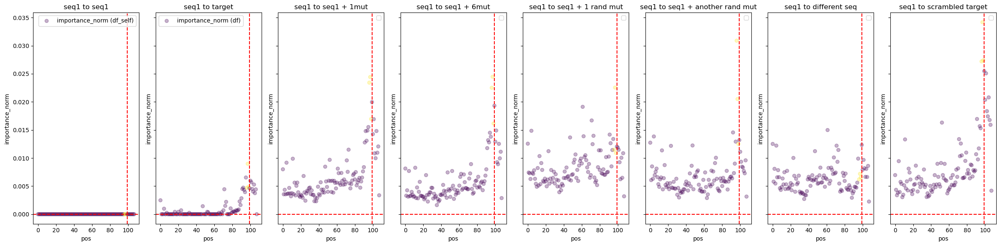

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


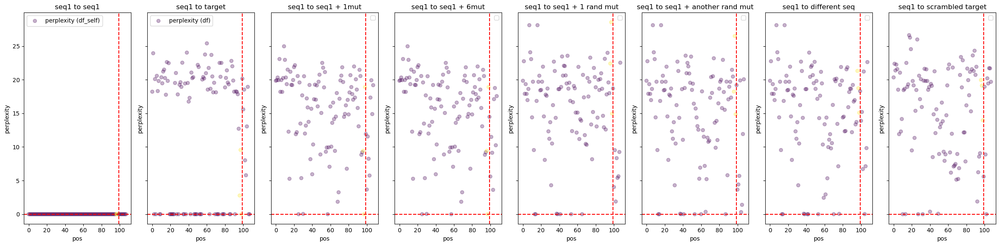

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


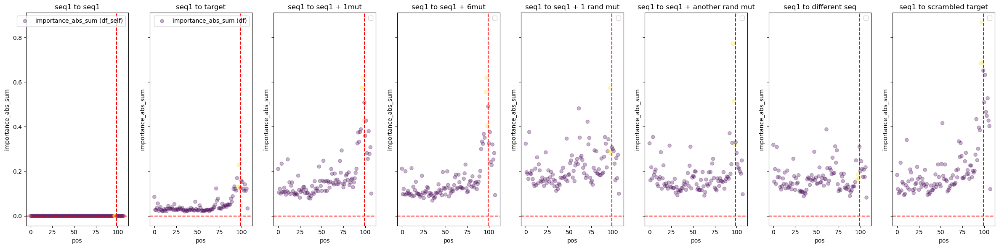

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


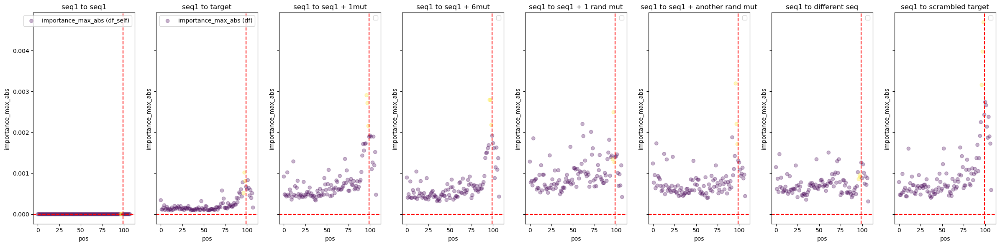

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


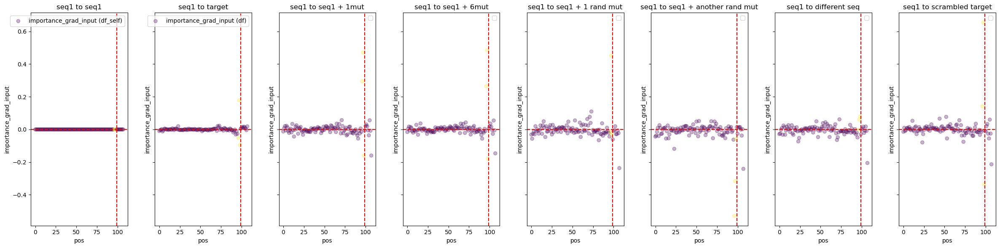

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


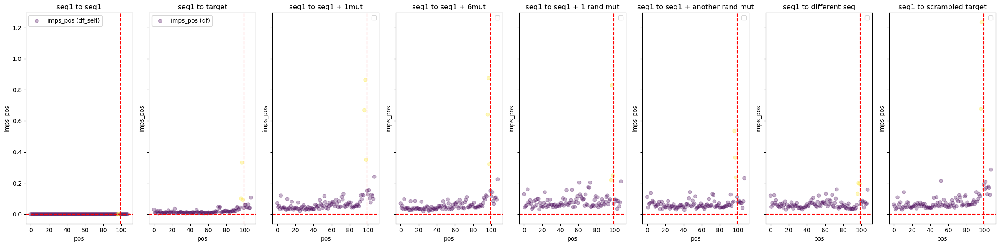

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


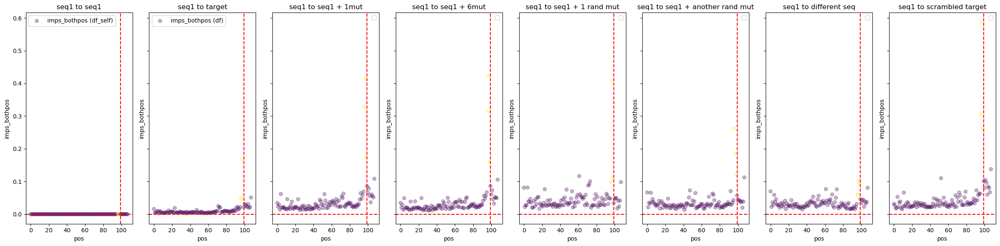

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


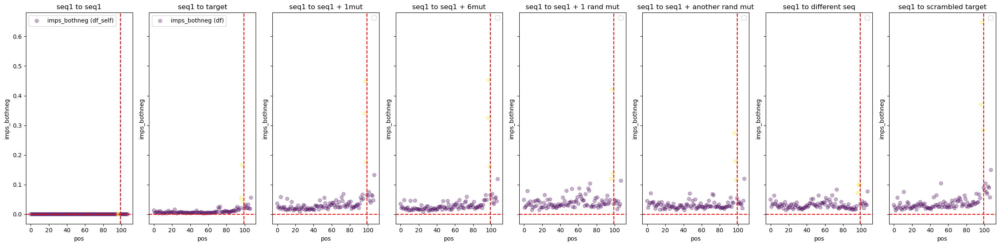

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


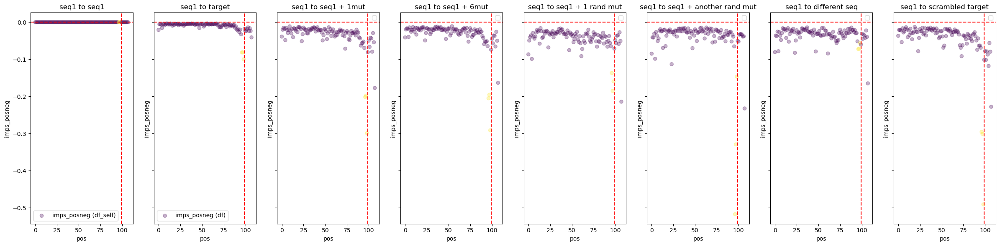

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


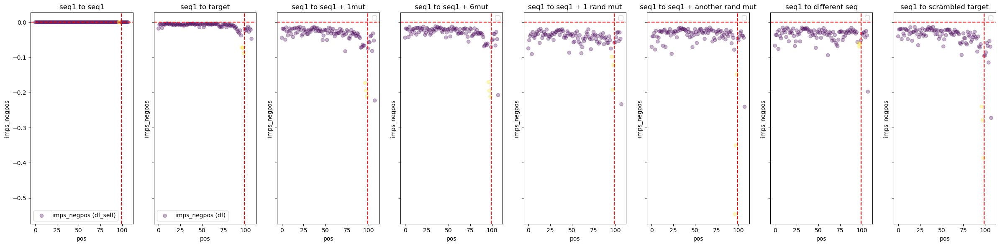

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


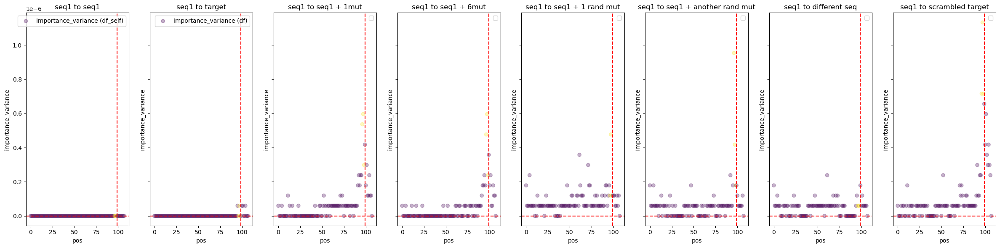

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


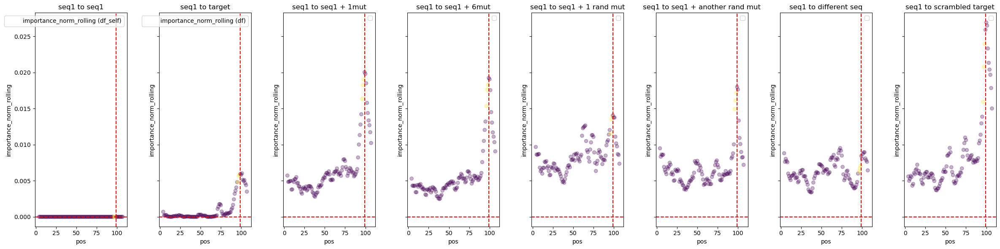

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


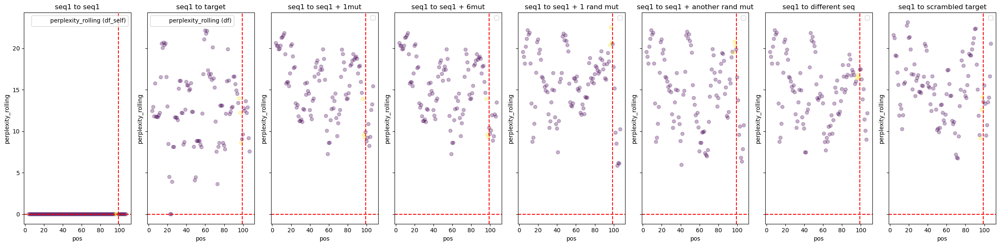

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


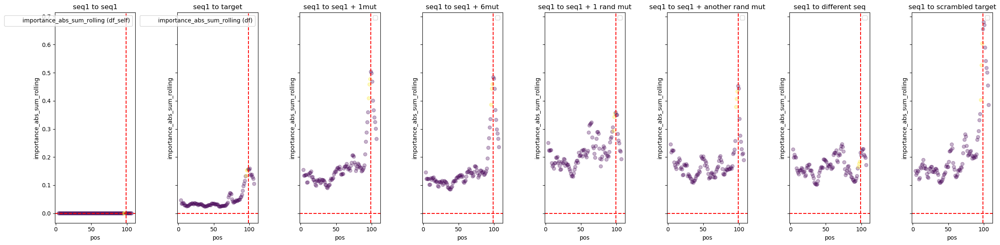

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


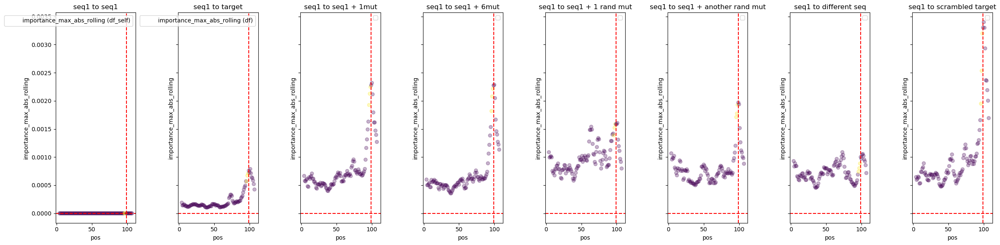

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


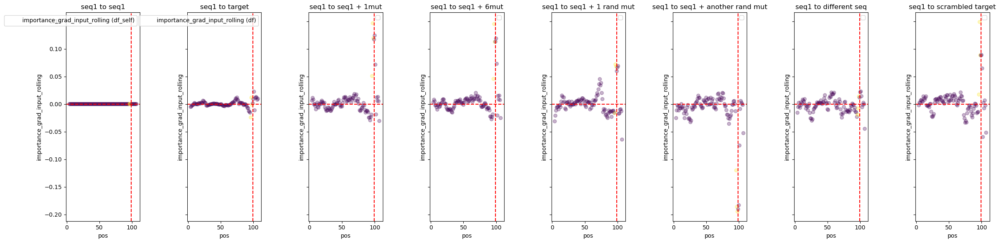

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


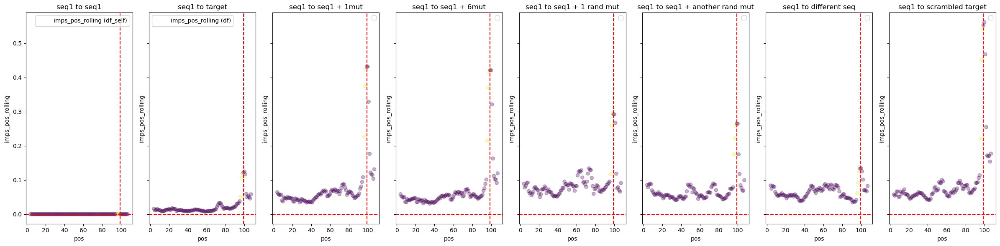

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


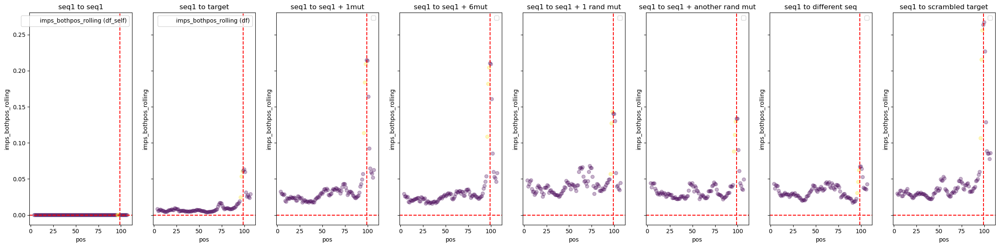

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


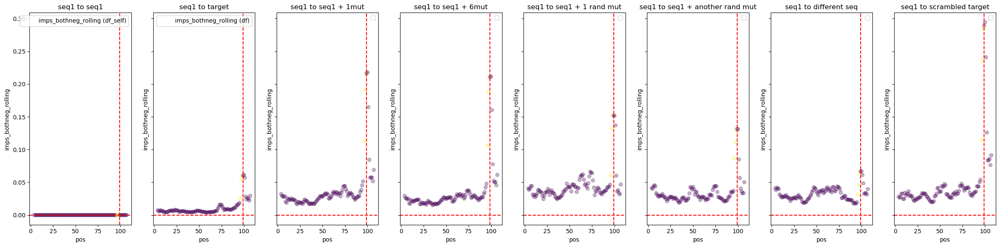

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


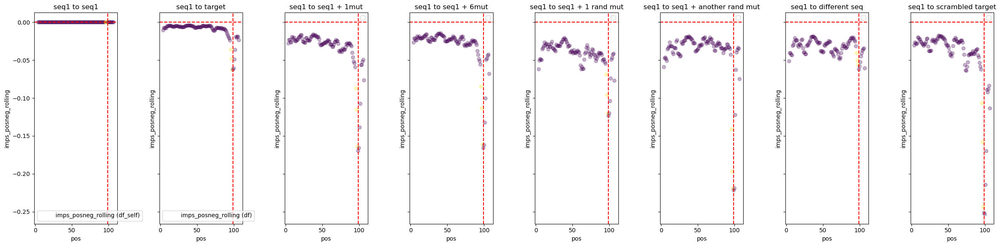

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


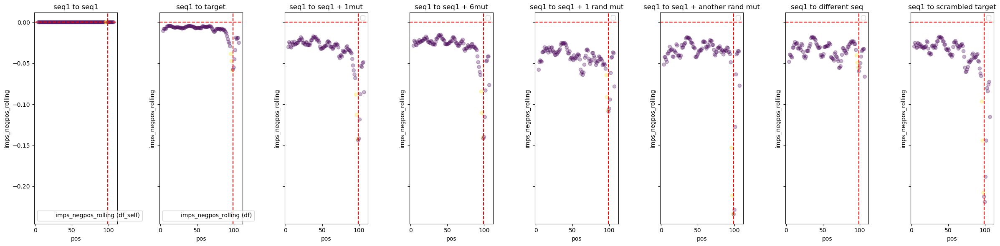

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


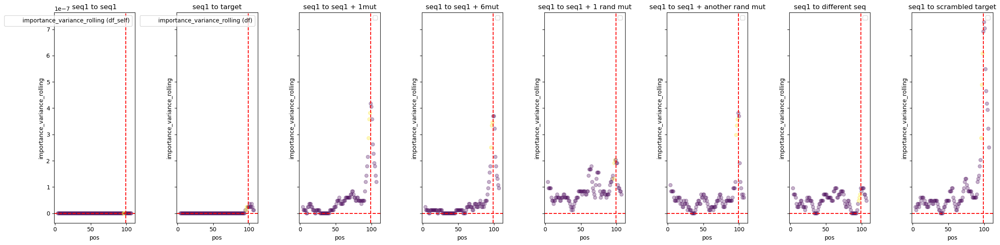

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


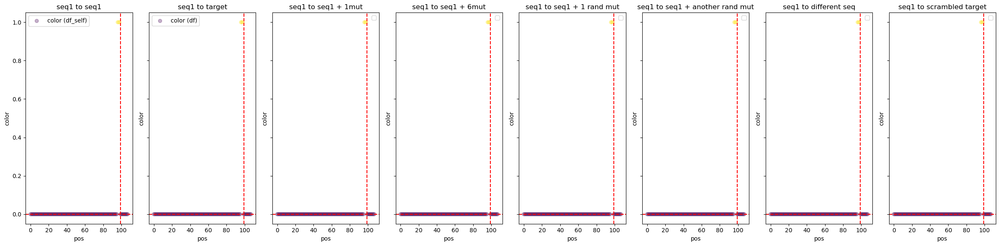

In [30]:
import matplotlib.pyplot as plt

# Assuming df and df_self are your DataFrames
# and both have the same columns for comparison

for column in df_self.columns:
    if column not in ['pos', 'tokenized_text']:
        # Set up the subplot
        
        fig, axs = plt.subplots(1, 8, figsize=(24, 6), sharey=True)


        # Plot for df_self
        axs[0].scatter(df_self['pos'], df_self[column], label=f'{column} (df_self)', c=df['color'], alpha = 0.3)
        axs[0].axvline(x=99, color='r', linestyle='--')
        axs[0].axhline(y=0, color='r', linestyle='--')
        axs[0].set_xlabel('pos')
        axs[0].set_ylabel(column)
        axs[0].set_title(f'seq1 to seq1')
        axs[0].legend()

        # Plot for df
        axs[1].scatter(df['pos'], df[column], label=f'{column} (df)', c=df['color'], alpha = 0.3)
        axs[1].axvline(x=99, color='r', linestyle='--')
        axs[1].axhline(y=0, color='r', linestyle='--')
        axs[1].set_xlabel('pos')
        axs[1].set_ylabel(column)
        axs[1].set_title(f'seq1 to target')
        axs[1].legend()
        
        
        # Plot for df
        axs[2].scatter(df_extra['pos'], df_extra[column], c=df['color'], alpha = 0.3)
        axs[2].axvline(x=99, color='r', linestyle='--')
        axs[2].axhline(y=0, color='r', linestyle='--')
        axs[2].set_xlabel('pos')
        axs[2].set_ylabel(column)
        axs[2].set_title(f'seq1 to seq1 + 1mut')
        axs[2].legend()

        # Plot for df
        axs[3].scatter(df_extra2['pos'], df_extra2[column], c=df['color'], alpha = 0.3)
        axs[3].axvline(x=99, color='r', linestyle='--')
        axs[3].axhline(y=0, color='r', linestyle='--')
        axs[3].set_xlabel('pos')
        axs[3].set_ylabel(column)
        axs[3].set_title(f'seq1 to seq1 + 6mut')
        axs[3].legend()

                # Plot for df
        axs[4].scatter(df_offtarget['pos'], df_offtarget[column], c=df['color'], alpha = 0.3)
        axs[4].axvline(x=99, color='r', linestyle='--')
        axs[4].axhline(y=0, color='r', linestyle='--')
        axs[4].set_xlabel('pos')
        axs[4].set_ylabel(column)
        axs[4].set_title(f'seq1 to seq1 + 1 rand mut')
        axs[4].legend()
        
        axs[5].scatter(df_offtarget2['pos'], df_offtarget2[column], c=df['color'], alpha = 0.3)
        axs[5].axvline(x=99, color='r', linestyle='--')
        axs[5].axhline(y=0, color='r', linestyle='--')
        axs[5].set_xlabel('pos')
        axs[5].set_ylabel(column)
        axs[5].set_title(f'seq1 to seq1 + another rand mut')
        axs[5].legend()
        
        axs[6].scatter(df_other['pos'], df_other[column], c=df['color'], alpha = 0.3)
        axs[6].axvline(x=99, color='r', linestyle='--')
        axs[6].axhline(y=0, color='r', linestyle='--')
        axs[6].set_xlabel('pos')
        axs[6].set_ylabel(column)
        axs[6].set_title(f'seq1 to different seq')
        axs[6].legend()
        
        axs[7].scatter(df_scramble['pos'], df_scramble[column], c=df['color'], alpha = 0.3)
        axs[7].axvline(x=99, color='r', linestyle='--')
        axs[7].axhline(y=0, color='r', linestyle='--')
        axs[7].set_xlabel('pos')
        axs[7].set_ylabel(column)
        axs[7].set_title(f'seq1 to scrambled target')
        axs[7].legend()
        
        
        
        # Show the plot
        plt.tight_layout()
        plt.show()


/tmp/ipykernel_3893083/4006239698.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 4, figsize=(18, 6))


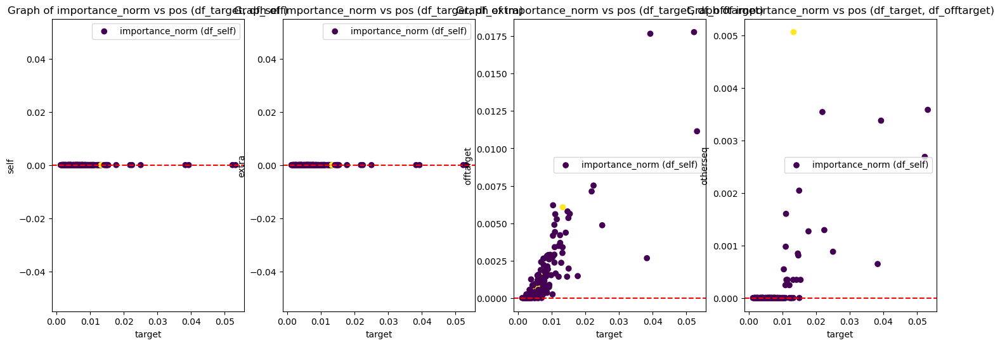

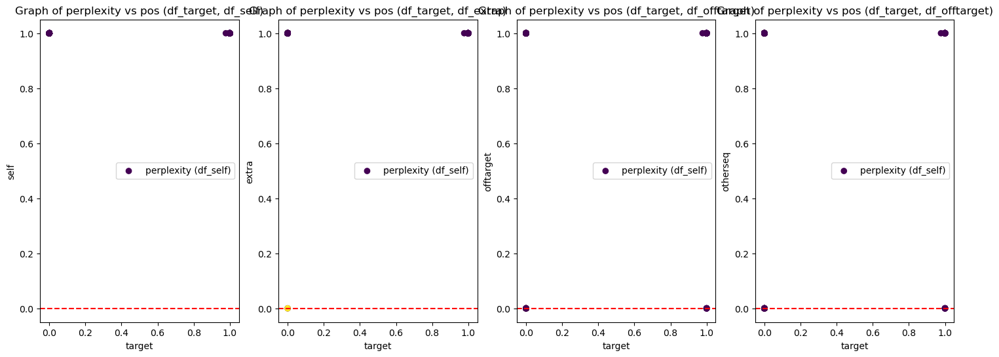

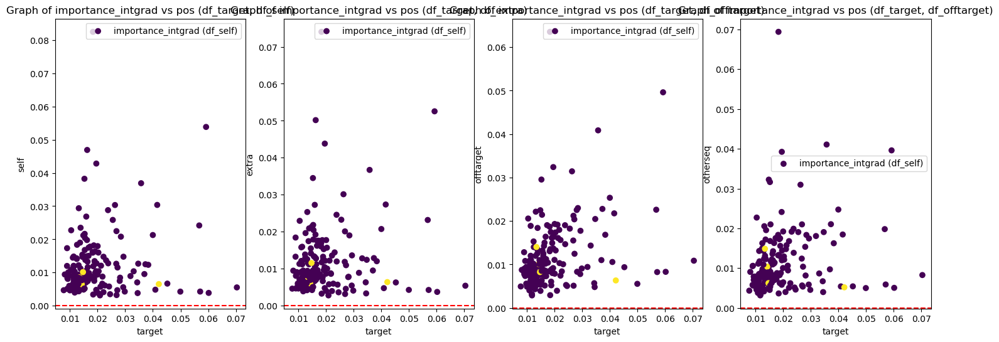

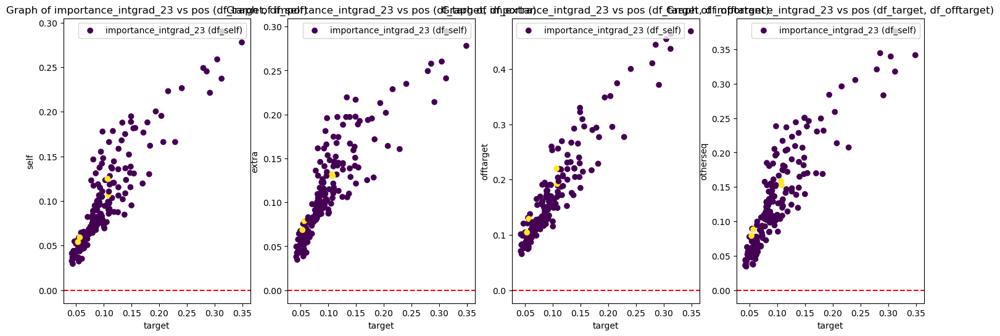

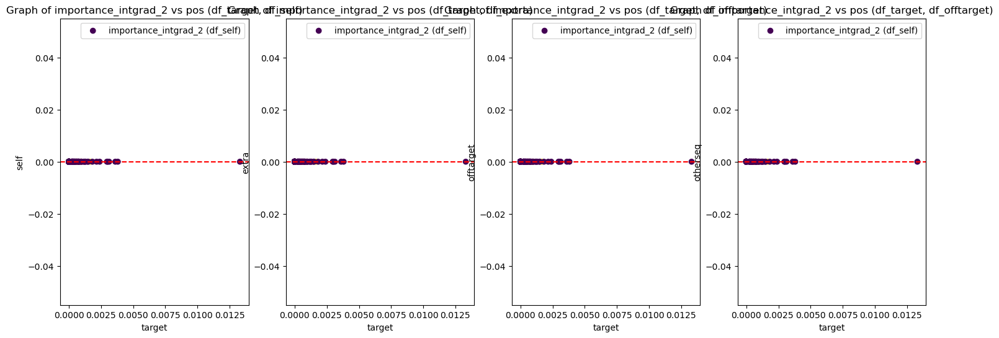

...

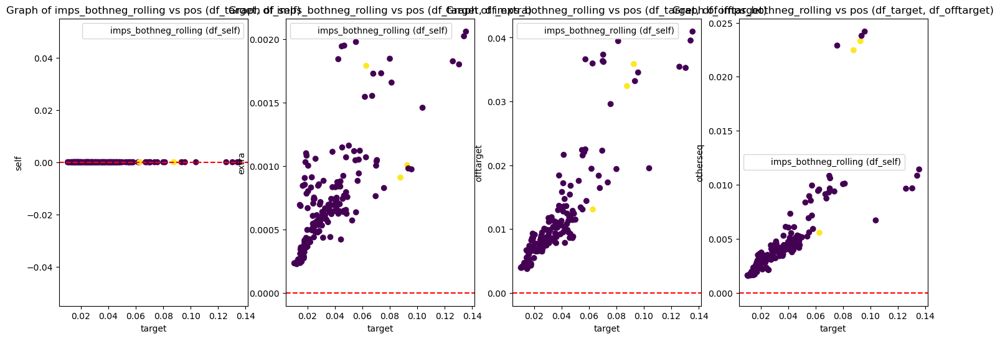

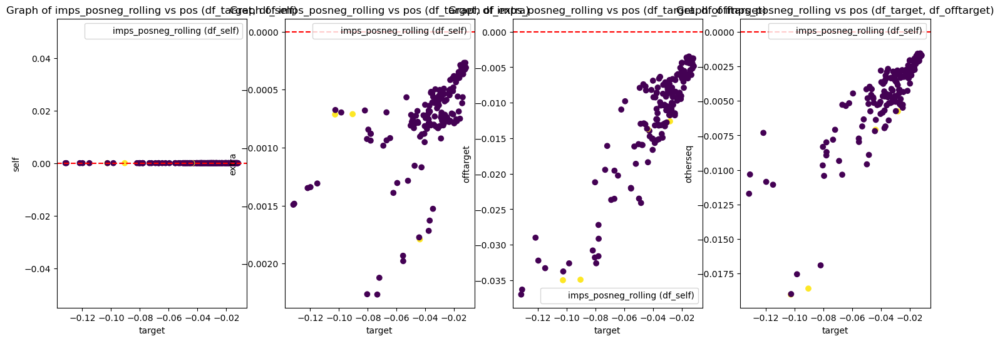

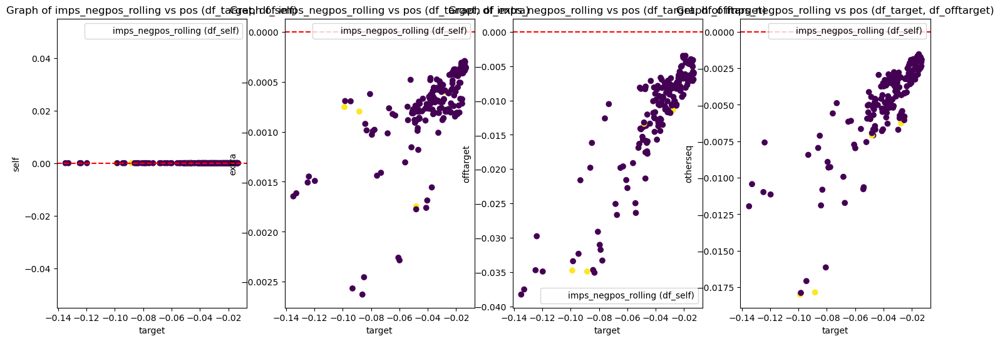

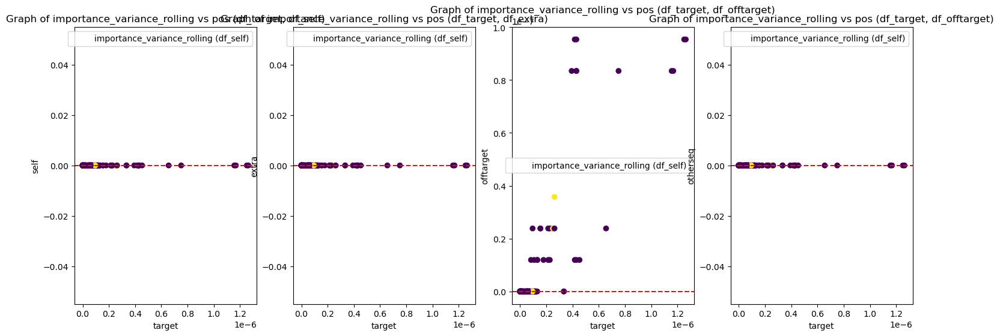

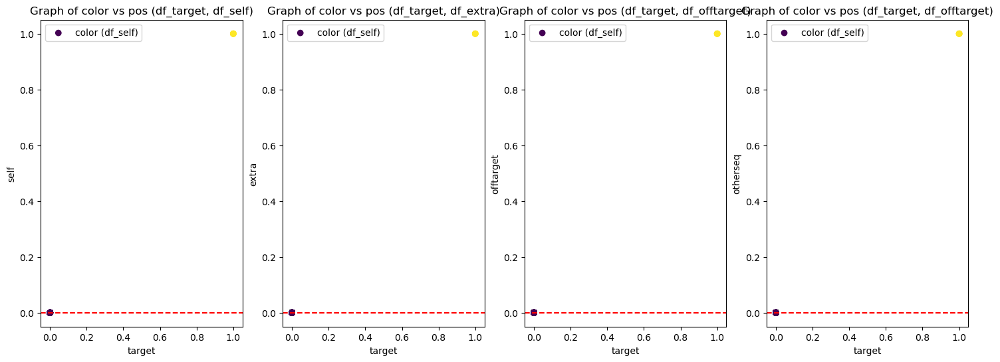

In [45]:
import matplotlib.pyplot as plt

# Assuming df and df_self are your DataFrames
# and both have the same columns for comparison

for column in df_self.columns:
    if column not in ['pos', 'tokenized_text']:
        # Set up the subplot
        
        fig, axs = plt.subplots(1, 4, figsize=(18, 6))


        # Plot for df_self
        axs[0].scatter(df[column], df_self[column], label=f'{column} (df_self)', c=df['color'])
        #axs[0].axvline(x=99, color='r', linestyle='--')
        axs[0].axhline(y=0, color='r', linestyle='--')
        axs[0].set_xlabel('target')
        axs[0].set_ylabel('self')
        axs[0].set_title(f'Graph of {column} vs pos (df_target, df_self)')
        axs[0].legend()
        
        axs[1].scatter(df[column], df_extra[column], label=f'{column} (df_self)', c=df['color'])
        #axs[1].axvline(x=99, color='r', linestyle='--')
        axs[1].axhline(y=0, color='r', linestyle='--')
        axs[1].set_xlabel('target')
        axs[1].set_ylabel('extra')
        axs[1].set_title(f'Graph of {column} vs pos (df_target, df_extra)')
        axs[1].legend()
        
        axs[2].scatter(df[column], df_offtarget2[column], label=f'{column} (df_self)', c=df['color'])
        #axs[2].axvline(x=99, color='r', linestyle='--')
        axs[2].axhline(y=0, color='r', linestyle='--')
        axs[2].set_xlabel('target')
        axs[2].set_ylabel('offtarget')
        axs[2].set_title(f'Graph of {column} vs pos (df_target, df_offtarget)')
        axs[2].legend()
        
        axs[3].scatter(df[column], df_other[column], label=f'{column} (df_self)', c=df['color'])
        #axs[2].axvline(x=99, color='r', linestyle='--')
        axs[3].axhline(y=0, color='r', linestyle='--')
        axs[3].set_xlabel('target')
        axs[3].set_ylabel('otherseq')
        axs[3].set_title(f'Graph of {column} vs pos (df_target, df_offtarget)')
        axs[3].legend()
        
        
        

In [ ]:
df.head(105).tail(10)


In [ ]:
df = df.sort_values(by='importance_intgrad_rolling', ascending=False)
df[~df['tokenized_text'].str.contains('X')].head(50)

#df[df['pos'] == 6].head(20)
#print(df)



In [ ]:
import requests
from transformers import T5Tokenizer
import string

# Download MIT's list of 10,000 English words
response = requests.get("https://www.mit.edu/~ecprice/wordlist.10000")
words = response.text.splitlines()

tokenizer = T5Tokenizer.from_pretrained("t5-small")

whole_words = []

for word in words:

    tokens = tokenizer.tokenize(word)
    # Add the [1:] because one token words from this website are tokenized as "_word"
    if len(tokens) == 1 and tokens[0][1:] == word:
        whole_words.append(word)

# Save whole words to a file
with open("whole_words.txt", "w") as f:
    for word in whole_words:
        f.write(f"{word}\n")

print(f"Saved {len(whole_words)} whole words to 'whole_words.txt'.")


In [ ]:
get_importance("I work abroad in engineering", "I work offshore in engineering", model, tokenizer)
#get_importance("I work abroad in engineering", "I work abroad in engineering", model, tokenizer)
#get_importance("I work abroad in biology", "I work abroad in engineering", model, tokenizer)
#get_importance("I work local in engineering", "I work abroad in engineering", model, tokenizer)
#get_importance("I work local in engineering", "I work abroad as an engineer", model, tokenizer)
get_importance("I work local in biology", "I work abroad in engineering", model, tokenizer)
get_importance("I work local in biology", "Cats are very good animals", model, tokenizer)

In [ ]:
get_importance("The movie was great because of its fantastic plot.","The film was bad because of its terrible plot.", model, tokenizer)
get_importance("The movie was great because of its fantastic plot","The film was bad because of its terrible plot", model, tokenizer)

get_importance("The movie was great because of its fantastic plot.","The film was great because of its terrible plot.", model, tokenizer)
get_importance("The movie was great because of its fantastic plot","The film was great because of its terrible plot", model, tokenizer)


In [ ]:

# Sample input and target
#get_importance("translate English to French: 'hello world'", "bonjour le monde", model) # ello most importance

get_importance("The movie was great because of its fantastic plot.","The film was bad because of its terrible plot.", model, tokenizer)
get_importance("The movie was great because of its fantastic plot","The film was bad because of its terrible plot", model, tokenizer)
get_importance("I work abroad in engineering", "I work offshore in engineering", model, tokenizer)
get_importance("I work abroad in engineering", "I work abroad in engineering", model, tokenizer)
get_importance("I work abroad in biology", "I work abroad in engineering", model, tokenizer)
get_importance("I work local in engineering", "I work abroad in engineering", model, tokenizer)
get_importance("I work local in engineering", "I work abroad as an engineer", model, tokenizer)
get_importance("I work local in biology", "I work abroad in engineering", model, tokenizer)
get_importance("I work abroad as an instructor", "I work nearby as an educator", model, tokenizer)
get_importance("I drink frozen coffee", "I drink cold coffee", model, tokenizer)
get_importance("I drink frozen coffee", "I drink cold tea", model, tokenizer)
get_importance("I drink frozen coffee often", "I drink cold tea often", model, tokenizer)
get_importance("I drink frozen coffee drink", "I eat cold coffee cake", model, tokenizer)
get_importance("I drink frozen coffee drink often", "I eat cold coffee cake often", model, tokenizer)
get_importance("I drink frozen coffee drink often", "I eat cold coffee cake rarely", model, tokenizer)
get_importance("I drink cold coffee cake often", "I eat cold coffee cake rarely", model, tokenizer)
get_importance("I drink frozen coffee drink", "We eat cold coffee cake today", model, tokenizer)
get_importance("I drink a frozen coffee drink yesterday. It was great!", "We eat a cold coffee cake today. It was great!", model, tokenizer)





In [ ]:
import numpy as np
import torch
from transformers import T5Tokenizer, T5Model, T5Config

# For hook to collect feed forward neuron activations
from transformers.models.t5.modeling_t5 import T5LayerFF


In [ ]:
# Plot each column against 'pos'
print(df)

            
for column in df.columns:
    if column != 'pos':
      if column != "tokenized_text":
        plt.figure(figsize=(10, 6))
        plt.scatter(df['pos'], df[column], label=column, c = df['color'])
        plt.axvline(x=99, color='r', linestyle='--', label='pos = 99')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.xlabel('pos')
        plt.ylabel(column)
        plt.title(f'Graph of {column} vs pos')
        plt.legend()
        plt.show()

     pos tokenized_text  importance_norm  importance_intgrad  \
0      0             ▁X     2.122892e-09            0.002883   
1      1             ▁X     6.102456e-10            0.003331   
2      2             ▁X     6.421187e-10            0.003017   
3      3             ▁X     4.804585e-10            0.003393   
4      4             ▁X     3.904405e-10            0.003989   
..   ...            ...              ...                 ...   
328  328             ▁E     8.262218e-11            0.006430   
329  329             ▁L     6.682022e-11            0.002924   
330  330             ▁Q     2.487682e-10            0.003971   
331  331             ▁X     1.713973e-10            0.007898   
332  332           </s>     1.454548e-10            0.004341   

     importance_intgrad_23  importance_intgrad_2  importance_intgrad_28  \
0                 0.040677              0.000414               0.000316   
1                 0.038783              0.000154               0.000106   
2     

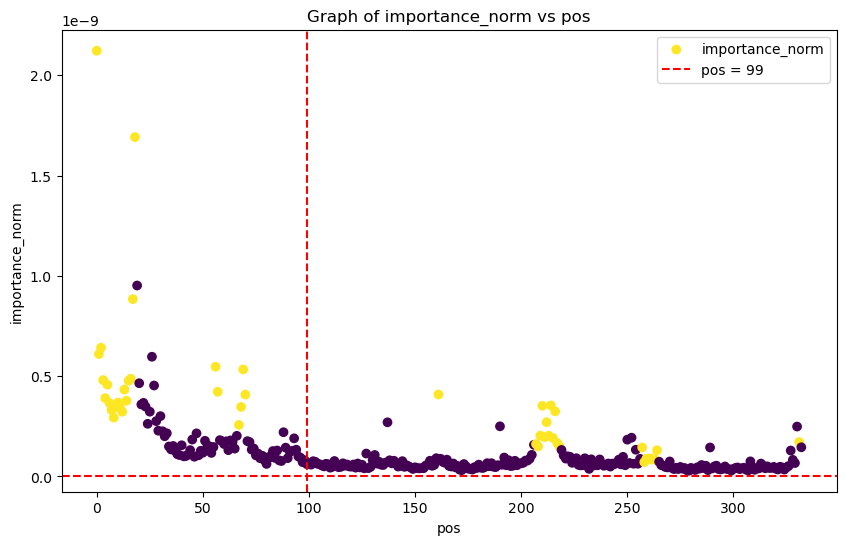

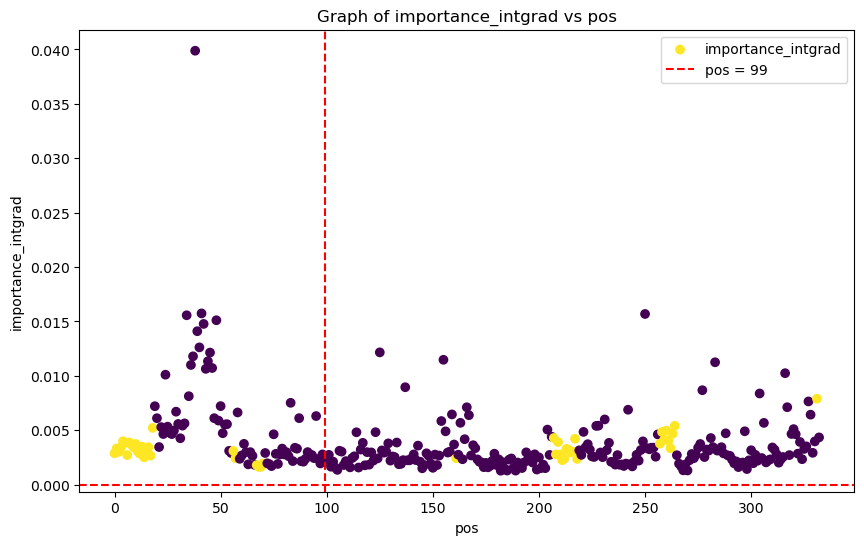

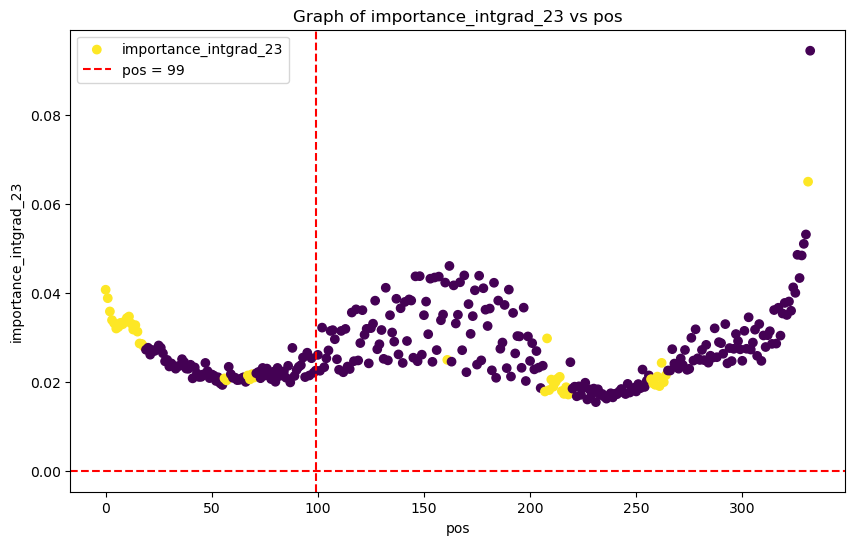

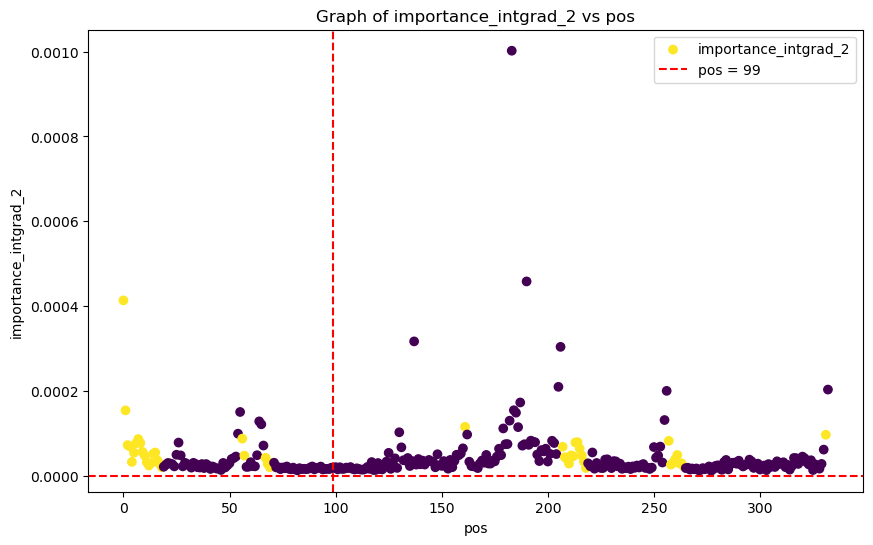

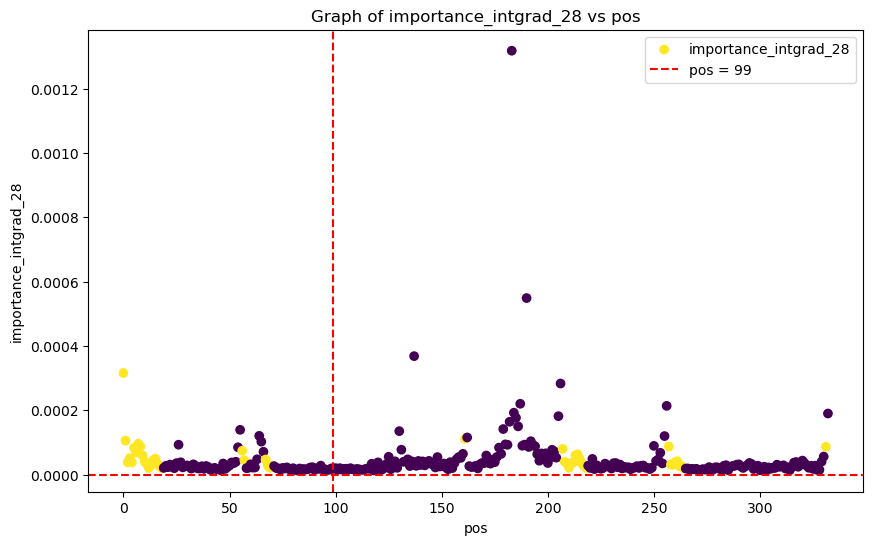

...

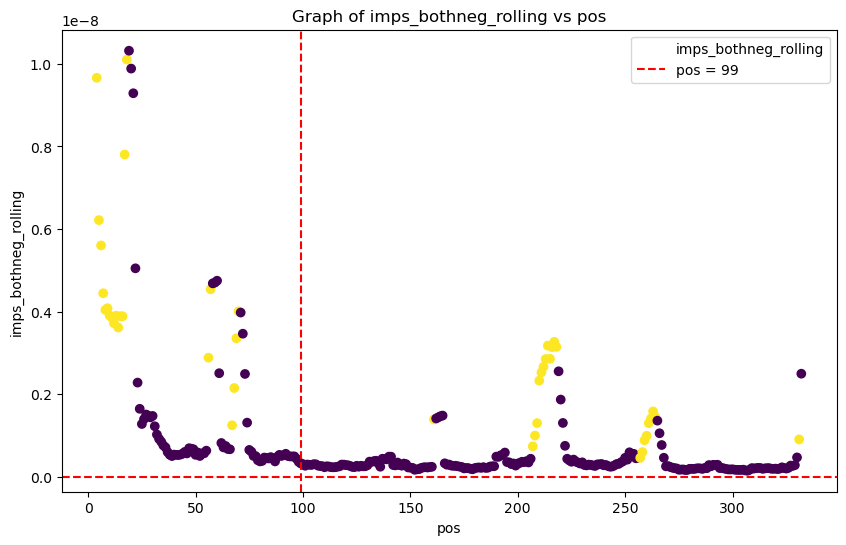

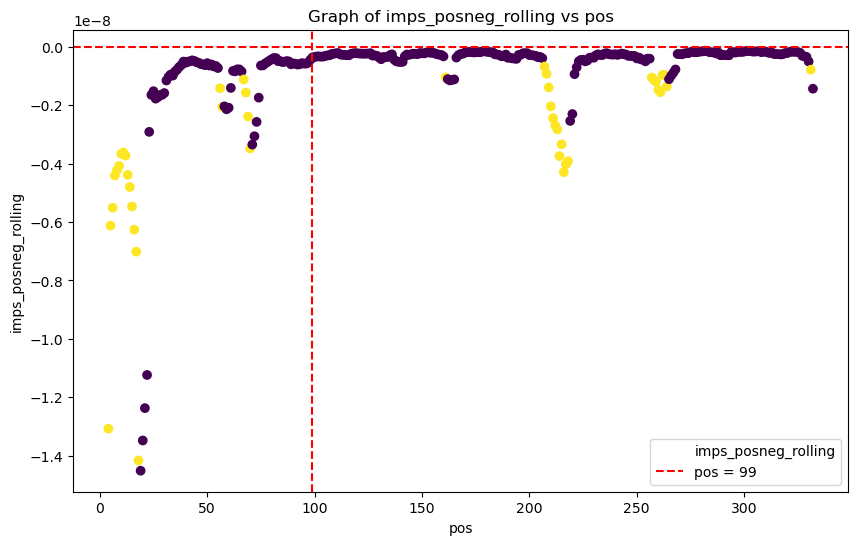

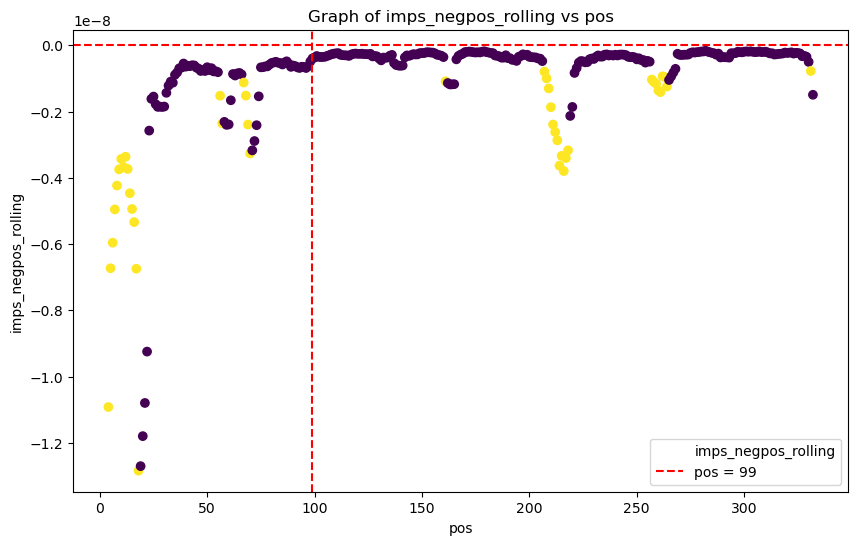

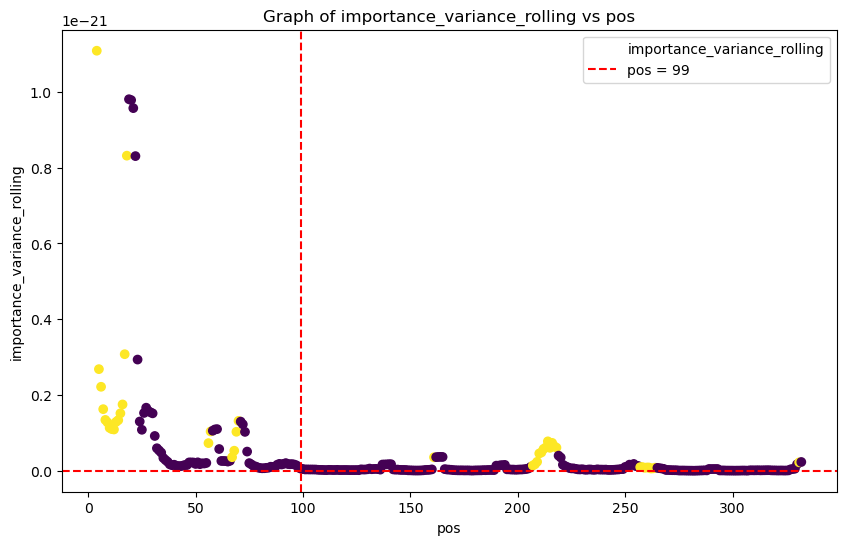

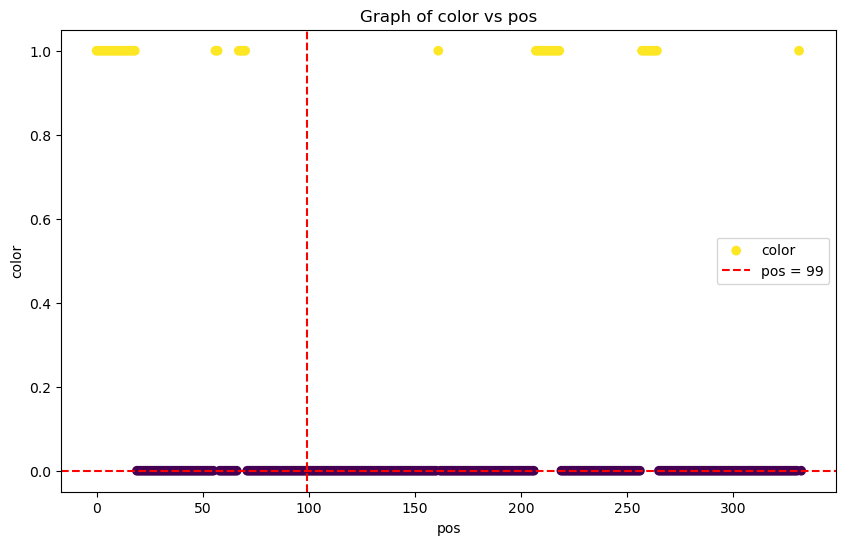

In [75]:
# Plot each column against 'pos'
print(df_self)
window_size = 5  # Adjust this based on your requirements

# Iterate over each column in the DataFrame, compute rolling mean, and store in a new column
#for column in df_self.columns:
#    if column != 'pos':  # Assuming 'pos' is the time or position column you mentioned
#        if column != 'tokenized_text':
#            df_self[f'{column}_rolling'] = df_self[column].rolling(window=window_size).mean()

#df_self['color'] = df_self['tokenized_text'].str.contains("X")
            
for column in df_self.columns:
    if column != 'pos':
      if column != "tokenized_text":
        plt.figure(figsize=(10, 6))
        plt.scatter(df_self['pos'], df_self[column], label=column, c = df['color'])
        plt.axvline(x=99, color='r', linestyle='--', label='pos = 99')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.xlabel('pos')
        plt.ylabel(column)
        plt.title(f'Graph of {column} vs pos')
        plt.legend()
        plt.show()

In [ ]:


# Load the model
model_name = 't5-small'
config = T5Config.from_pretrained(model_name, output_hidden_states=True)
model = T5Model.from_pretrained(model_name, config=config)
tokenizer = T5Tokenizer.from_pretrained(model_name)
model.eval()


# Get the number of layers for the encoder (and decoder, which is the same for T5)
num_layers = config.num_layers
print(f"Number of layers: {num_layers}")

# Get the number of neurons in the feed-forward part (d_ff in T5's terminology)
num_neurons_ff = config.d_ff
print(f"Number of neurons in the feed-forward part: {num_neurons_ff}")


print("Model loaded")

In [ ]:

# Confirm that test words are full tokens for ease of testing
# Each amino acid is a full token

# Not full tokens: ate, eat, drank.
sentence = "I We cut pour drink cold frozen coffee cake frequently in the morning evening often rarely"
tokens = tokenizer.tokenize(sentence)
print(tokens)

In [ ]:
# If needed, this can be turned in a nested dictionary
# Doing a hook that doesn't keep all amino acid-specific activations. Maybe better to compute these on-the-fly if needed for space reasons.
def hook_aa(module, input, output):
    # The hooked values are appended to the 'hooked_activations' list.
    hooked_activations.append(output)
    # Each layer of t5-small (6) is 2048 long (goes from 512 -> 2048 -> 512)

def hook_seq(module, input, output):
    # The hooked values are appended to the 'hooked_activations' list.
    hooked_activations.append(torch.sum(output, axis = 1))


# First loop through layers (ex. 6 layers)
for block in model.encoder.block:
    # Then loop through components (attn, ff) of the layer
    for x in block.layer:
         if isinstance(x, T5LayerFF) :
            #print(dir(x.DenseReluDense.wi))
            x.DenseReluDense.wi.register_forward_hook(hook_seq)
"""
T5DenseActDense(
  (wi): Linear(in_features=512, out_features=2048, bias=False)
  (wo): Linear(in_features=2048, out_features=512, bias=False)
  (dropout): Dropout(p=0.1, inplace=False)
  (act): ReLU()
"""



Important paper on knowledge neurons

https://aclanthology.org/2022.acl-long.581/

Z1 = X * wi + b1

A1 = ReLU(Z1)

Z2 = A1 * wo + b2

Here, Z1 is the output of the wi layer, A1 is the output after applying the ReLU activation function, and Z2 is the output of the wo layer. If you access wo, you are accessing the weights used to compute Z2 from A1.

In [ ]:
# Test hook
hooked_activations = []
sentences = ["I drink water", "I drink tea"]
with torch.no_grad():
   inputs = tokenizer(text = sentences, return_tensors="pt", padding="max_length", truncation=True, max_length=50)

   #inputs = tokenizer("Translate English to French: Hello, world!", return_tensors="pt")
   outputs = model.encoder(**inputs)
#print(hooked_activations)
#print(hooked_activations[1].shape)
#print(len(hooked_activations))
#print(hooked_activations[1].shape)
##print(hooked_activations[1])
#print(torch.sum(hooked_activations[1], dim = 1).shape)


In [ ]:
def get_activations_ff(sequences, model, config, hooked_activations = []):
    numseqs = len(sequences)
    numlayers = config.num_layers
    numneurons = config.d_ff
    maxlen = 50


    with torch.no_grad():
        inputs = tokenizer(text = sequences, return_tensors="pt", padding="max_length", truncation=True, max_length=maxlen)
        outputs = model.encoder(**inputs)

    print("hooked")
    stacked = np.stack(hooked_activations)
    print(stacked.shape)


    #x = np.sum(stacked, axis = 2)
    #print(x.shape)
    reshaped_array = np.transpose(stacked, (1, 0, 2)).reshape(2, -1)
    #print(result.shape)

    # This is for the hook_aa
    #reshaped_array = stacked.transpose(1, 2, 0, 3).reshape(numseqs, maxlen, numlayers * numneurons)
    print(reshaped_array.shape)
    return(reshaped_array)





In [ ]:
sequences = ["I drink frozen coffee drink often", "I eat cold coffee cake frequently"]
#sequences = ["We drink frozen coffee drink often", "I eat cold coffee cake frequently"]

hooked_activations = []
activations_ff = get_activations_ff(sequences, model, config, hooked_activations)

print(activations_ff.shape)

summarized_data = np.sum(activations_ff, axis=1)

print(data)
print(summarized_data.shape)
print(summarized_data)


# Example data
data = np.random.rand(2, 3, 3)

# Sum across the second dimension
summarized_data = np.sum(data, axis=1)

print(data)
print(summarized_data.shape)
print(summarized_data)


So what we can do... We have

SEQUENCE GO:001,GO:002,GO:003
Also annotations per amino acid
S: transmembrane,active site,hydrophobicity.

Each word has a list of activations per neuron ( 2048 * numlayers)
To get the overall activation sor a sequence, sum the activations for the whole sequence

So each sequence has a vector (numneurons* numlayers).

protT5 has 16384 neuron * 24 layers activations

For 3 sequences:
Object aa_activations dimensions: (3, 35, 393216)
Object sequence_activations dimensions: (3, 393216)


# So if we have 100,000 sequences
(100000, 393216)

100000 protein names,

take protein name vector, list of 393216 activation values.


Each sequence has a set of GO terms. Use Maayan lab enrichr as data source


*Take each neuron. We have its values for all proteins. Do a weighted GO term enrichment for that neuron, using the activation values as the weighting.* Do this with blitzgsea.

What next?

So you have a new protein. Can see the most strongly activated neurons. Scatter of activation vs max significance of GO:term?

Because I assume all proteins will activate some neurons strongly, but there may not be any significant go terms.

## Blitzgsea notes

- Need to convert uniprot accs to entrez gene ids
- Use cacheing to avoid recalculating the expectation every time
- Run serially across all neurons (2048 * layers).
- How many organisms do we start with.
- Maybe the QFO 66 set. Or a smaller set, just human for now.

## Data shapes

Run each protein through,
Get a numpy array shape (num_prots, 2048*layers)
Keep a list of protein names.

Break into list of shapes for blitzgsea input.
list of len 2048*layers,


## What about position specific annotations??
https://www.uniprot.org/help/sequence_annotation
Now we have a sets of activations for each position with and without each feature.







So for the amino acid annotations.





In [ ]:

# This is a block to go from the numpy array of neuron activations to the input format for blitzgsea
import numpy as np
import pandas as pd

# Example data
numprots = 5 # If there are 5 proteins.
data = np.random.rand(numprots, 1000) # If there are 1000 neurons
prot_names = ['prot' + str(i) for i in range(numprots)] # random prot names

print(data)
# Create list of dataframes
df_list = [pd.DataFrame({0: prot_names, 1: data[:, i]}) for i in range(1000)]

# Example: Access the 1st dataframe
print(df_list[0])
#In this example, data is a numpy array with dimensions [numprots, 1000] and prot_names is a list of length numprots. The df_list variable will be a list of 1000 pandas dataframes, each with the names from prot_names as the first column and a vector from the second dimension of the original array as the second column.







In [ ]:
 pip install blitzgsea

In [ ]:
import blitzgsea as blitz
import pandas as pd

# read signature as pandas dataframe
signature = pd.read_csv("https://github.com/MaayanLab/blitzgsea/raw/main/testing/ageing_muscle_gtex.tsv")

# Each signature is a two column pandas dataframe (columns 0, 1).
# Column 1 is the gene name
# Column 2 is the enrichment. From -8 to +9 in this example
print(signature.shape)
print(signature)i

In [ ]:

# list available gene set libraries in Enrichr
blitz.enrichr.print_libraries()

# use enrichr submodule to retrieve gene set library
library = blitz.enrichr.get_library("GO_Molecular_Function_2017b")

# run enrichment analysis
result = blitz.gsea(signature, library)

In [ ]:
print(result)

## Working out connections to activations

In [ ]:
sequences = ["I drink frozen coffee drink often", "I eat cold coffee cake frequently"]
#sequences = ["We drink frozen coffee drink often", "I eat cold coffee cake frequently"]

hooked_activations = []
activations_ff = get_activations_ff(sequences, model, config, hooked_activations)


In [ ]:
#sequences = ["I drink water", "We drink coffee"]

sequences = ["I drink frozen coffee drink often", "I eat cold coffee cake frequently"]
#sequences = ["We drink frozen coffee drink often", "I eat cold coffee cake frequently"]

hooked_activations = []
activations_ff = get_activations_ff(sequences, model, config, hooked_activations)

activations_ff.shape

# Not useful
print("maxes")
print(np.max(activations_ff[1,0,:] - activations_ff[0,0,:]))
print(np.max(activations_ff[1,1,:] - activations_ff[0,1,:]))
print(np.max(activations_ff[1,2,:] - activations_ff[0,2,:]))
print(np.max(activations_ff[1,3,:] - activations_ff[0,3,:]))
print(np.max(activations_ff[1,4,:] - activations_ff[0,4,:]))
print(np.max(activations_ff[1,5,:] - activations_ff[0,5,:]))


print("norms")
print(np.linalg.norm(activations_ff[1,0,:] - activations_ff[0,0,:]))
print(np.linalg.norm(activations_ff[1,1,:] - activations_ff[0,1,:]))
print(np.linalg.norm(activations_ff[1,2,:] - activations_ff[0,2,:]))
print(np.linalg.norm(activations_ff[1,3,:] - activations_ff[0,3,:]))
print(np.linalg.norm(activations_ff[1,4,:] - activations_ff[0,4,:]))
#print(np.linalg.norm(activations_ff[1,5,:] - activations_ff[0,5,:]))




import matplotlib.pyplot as plt
#plt.scatter(activations_ff[0,0,:], activations_ff[1,0,:])
plt.scatter(activations_ff[0,1,:], activations_ff[1,1,:])
#plt.scatter(activations_ff[0,2,:], activations_ff[1,2,:])
plt.scatter(activations_ff[0,4,:], activations_ff[1,4,:])

indices1 = np.argsort(activations_ff[1,0,:] - activations_ff[0,0,:])
largest_indices1 = indices1[::-1]

indices2 = np.argsort(activations_ff[1,1,:] - activations_ff[0,1,:])
largest_indices2 = indices2[::-1]

indices3 = np.argsort(activations_ff[1,2,:] - activations_ff[0,2,:])
largest_indices3 = indices3[::-1]

indices4 = np.argsort(activations_ff[1,3,:] - activations_ff[0,3,:])
largest_indices4 = indices4[::-1]

indices5 = np.argsort(activations_ff[1,4,:] - activations_ff[0,4,:])
largest_indices5 = indices5[::-1]

indices6 = np.argsort(activations_ff[1,5,:] - activations_ff[0,5,:])
largest_indices6 = indices6[::-1]
# Maybe we can rank the indices of the most changed neurons.

k = 10
print(largest_indices1[:k])
print(largest_indices2[:k])
print(largest_indices3[:k])
print(largest_indices4[:k])
print(largest_indices5[:k])
print(largest_indices6[:k])

# In this example, changing drink/eat and drink/cake both change the same neuron.
sequences = ["I drink frozen coffee drink", "I eat cold coffee cake"]

print(activations_ff[1,4,4529], activations_ff[0,4,4529])
print(activations_ff[1,1,4529], activations_ff[0,1,4529])

print("most active")
k = 6
print(activations_ff[1,4,largest_indices5[:k]], activations_ff[0,4,largest_indices5[:k]])

print(activations_ff[1,4,largest_indices5[:k]] - activations_ff[0,4,largest_indices5[:k]])



print("test")
print(activations_ff[1,1,4529], activations_ff[0,1,4529])

# Would changing each member of a zinc finger domain, change the activations of the same neuron?

#neuron number <-> aaposition##




In [ ]:

# Note: Truncated to the max length of the sentence
# Note:
def get_activations_embeddings(sentence, layer = -1):
    inputs = tokenizer(sentence, return_tensors="pt", padding="max_length", truncation=True, max_length=50)
    with torch.no_grad():
        # We'll consider the output from the last encoder layer
        outputs = model.encoder(**inputs)

        #activations_old = outputs.last_hidden_state
        #print(activations_old)
        all_hidden_states = outputs[0].hidden_states
        #print("here", all_hidden_states)
        activations = all_hidden_states[layer]
        #print(activations)
    # If you want the hidden state of a particular layer (e.g., 5th layer):
    # layer_5_activations = all_hidden_states[5]
    return activations

In [ ]:

def compute_differential_activations(sentence1, sentence2):
    activations1 = get_activations(sentence1, -2)
    activations2 = get_activations(sentence2, -2)


    print(activations1.shape)
    #print(activations2)
    # Compute the differential activations (e.g., using L2 norm)
    differential_activations = (activations1 - activations2).norm(dim=-1).squeeze(0)
    print(differential_activations)

    # Associate differential activations with words
    #print(sentence1)
    tokens1 = tokenizer.tokenize(sentence1)
    tokens2 = tokenizer.tokenize(sentence2)

    tokens = ["{}-{}".format(x[0][1:], x[1][1:]) for x in list(zip(tokens1, tokens2))]
    print(tokens)
    diff_activations_dict = {token: diff_activation.item() for token, diff_activation in zip(tokens, differential_activations)}

    return diff_activations_dict

In [ ]:
numsequences = len(sentences)
maxlen = 50
numlayers = 6
numneurons = 2048

# Stack list of tensors to have shape [numsequences, maxlen, numlayers, numneurons]
stacked = np.stack(hooked_activations)
print(stacked.shape)

reshaped_array = stacked.transpose(1, 2, 0, 3).reshape(numsequences, maxlen, numlayers * numneurons)

print(reshaped_array.shape)

result1 = stacked.sum(arr, axis=(3, 4))
print(result1.shape)


In [ ]:

# Going to collect feed forward activations here




sentence1 = "I cut coffee cake often twice"
sentence2 = "I pour coffee drinks frequently twice"

differential_activations = compute_differential_activations(sentence1, sentence2)
print(differential_activations)

In [ ]:
# Test batch of sentences
hooked_activations = []
sequences = ["I drink water", "We drink coffee"]
with torch.no_grad():
   inputs = tokenizer(text = sequences, return_tensors="pt", padding="max_length", truncation=True, max_length=50)

   #inputs = tokenizer("Translate English to French: Hello, world!", return_tensors="pt")
   outputs = model.encoder(**inputs)
print(len(hooked_activations))
print(hooked_activations[1].shape)
print(hooked_activations[1])

# So dimensions are:

# numlayers, numsequences, maxlen, numneurons






In [ ]:

# Res9hape tensor

numsequences = 1
nlayers = 6
maxlen = 50
# Step 1: Stack them
stacked_tensor = torch.cat(hooked_activations, dim=0)  # Size: [6, 50, 2048]

print(stacked_tensor.shape)

# Transpose the tensor to get shape [50, 6, 2048]
transposed_array = stacked_tensor.transpose(0, 1)

# Reshape the tensor to get shape [50, 6*2048]
reshaped_array = transposed_array.contiguous().view(maxlen, nlayers*2048)

print(reshaped_array.shape)

#[layernum, position, activations]

# So to get the tensors

## Step 2: Reshape
#reshaped_tensor = stacked_tensor.reshape(3, 6, 50, 2048)  # Size: [3, 6, 50, 2048]

## Step 3: Convert to numpy
#numpy_array = reshaped_tensor.numpy()

#numpy_array

#print("ha")
#print(hooked_activations[7].shape)
#print("na")
#print(numpy_array[1, 1, :,:].shape)



**This is a case where on word slightly changes the meaning**

- I work abroad in engineering


- I work offshore as an engineer



**location difference**

- I work abroad as an instructor**

- I work nearby as an educator**



**simple coffee/tea**

- I drink a frozen coffee

- I drink a cold coffee

- I drink a cold tea


**linked drank/drink, ate/cake**

- I drink frozen coffee drink

- I eat cold coffee cake


**Add in time difference**

- I drink frozen coffee drink often

- I eat cold coffee cake rarely




**Add in subject difference**
- I drink frozen coffee drink.

- We eat cold coffee cake today

**Add in 2nd sentence**
- I drank a frozen coffee drink yesterday. It was great!

- We ate a cold coffee cake today. It was great!

## GOAL: Identify linkage between drank/drink, and ate/cake




